# Analisis Ketahanan Pangan Indonesia — Bayesian Multilevel Spatial Ordinal Logistic Regression (CAR)

**Catatan hasil perapian kode:**
- Kode asli (372 cell) berisi banyak duplikasi (blok plot per-variabel yang identik pola, hanya beda nama kolom), cell yang mati/di-*comment*, beberapa versi model eksperimen tercampur dengan model final, dan cell yang terpotong.
- Notebook ini menyusun ulang alur kerja menjadi tahapan yang jelas: **Setup → Load Data → Cleaning → Integrasi → Feature Engineering → EDA → Analisis Deskriptif → Analisis Spasial → Pemodelan Bayesian (Null → Multilevel → CAR) → Perbandingan Model → Ekspor Hasil**.
- Bagian plot per-variabel yang tadinya 15+ cell terpisah (masing-masing ~20 baris identik) disatukan menjadi satu fungsi `plot_variabel_provinsi()` yang dipanggil dalam satu loop.
- Hanya model final tervalidasi yang dipertahankan (prior sudah melalui *prior predictive check* bertahap): `model_null` (baseline ICC), `model_multilevel` (fixed + random effect provinsi), dan `model_car` (menambahkan efek spasial CAR non-centered).
- **Penting:** karena saya tidak memiliki akses ke file data Anda, saya tidak bisa menjalankan ulang notebook ini untuk memverifikasi setiap nama kolom persis sama dengan sumber Anda. Silakan jalankan sel demi sel dan sesuaikan bila ada nama kolom/variabel yang meleset dari data aktual Anda.


# 1. Setup & Import Library

In [2]:
# Clone repository data (khusus Google Colab)
!git clone https://github.com/dwibagusd/Multilevel-Ordinal-Logistic-Regression-and-Spatial-Analysis-Food-Security.git


Cloning into 'Multilevel-Ordinal-Logistic-Regression-and-Spatial-Analysis-Food-Security'...
remote: Enumerating objects: 487, done.
remote: Counting objects: 100% (114/114), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 487 (delta 95), reused 62 (delta 62), pack-reused 373 (from 1)
Receiving objects: 100% (487/487), 10.03 MiB | 15.94 MiB/s, done.
Resolving deltas: 100% (282/282), done.


In [3]:
%pip install pymc==5.28.5 -q


In [4]:
# --- Data wrangling ---
import json
import numpy as np
import pandas as pd

# --- Geospasial ---
import geopandas as gpd
import libpysal as lps
from libpysal.weights import Queen
from esda.moran import Moran, Moran_Local
from splot.esda import plot_moran, moran_scatterplot, lisa_cluster
import networkx as nx

# --- Visualisasi ---
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sns

# --- Statistik & Bayesian ---
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pymc as pm
import arviz as az

# --- Google Colab (mount drive untuk file pendukung) ---
from google.colab import drive
drive.mount('/content/drive')

# Palet warna kustom (dipakai konsisten di seluruh notebook)
CMAP_HIJAU_KE_MERAH = LinearSegmentedColormap.from_list('gyr', ['#991b1c', '#fde78c', '#15803c'])
CMAP_MERAH_KE_HIJAU = LinearSegmentedColormap.from_list('gyr_r', ['#15803c', '#fde78c', '#991b1c'])

sns.set_theme(style="whitegrid")


Mounted at /content/drive


### Daftar variabel prediktor
Didefinisikan sekali di awal agar konsisten dipakai di seluruh notebook (EDA, korelasi, VIF, dan pemodelan),
sehingga tidak perlu ditulis ulang di banyak cell seperti pada kode asli.


In [5]:
KOLOM_PREDIKTOR = [
    "NCPR", "ENERGI", "PROHE", "CBPK", "MISKIN", "CVHARGA", "POU",
    "RLSP", "TNPAIR", "TNPLISTRIK", "NAKES", "AHH", "AMANPANGN",
    "PPH", "STUNTING", "BANSOS",
]
KOLOM_NUMERIK_LENGKAP = KOLOM_PREDIKTOR + ["IKP"]

LABEL_VARIABEL = {
    "NCPR": "Rasio Konsumsi Normatif per Kapita",
    "ENERGI": "Rasio Ketersediaan Energi per Kapita per Hari",
    "PROHE": "Rasio Ketersediaan Protein Hewani",
    "CBPK": "Rasio Ketersediaan Cadangan Beras",
    "MISKIN": "Persentase Penduduk Miskin",
    "CVHARGA": "Variasi Harga Pangan",
    "POU": "Prevalence of Undernourishment",
    "RLSP": "Rata-rata Lama Sekolah Perempuan",
    "TNPAIR": "Persentase Tanpa Air Bersih",
    "TNPLISTRIK": "Persentase Tanpa Listrik",
    "NAKES": "Rasio Tenaga Kesehatan",
    "AHH": "Angka Harapan Hidup",
    "AMANPANGN": "Proporsi Pengeluaran Pangan",
    "PPH": "Pola Pangan Harapan",
    "STUNTING": "Persentase Stunting",
    "BANSOS": "Anggaran Bansos Pangan (Rp)",
    "IKP": "Indeks Ketahanan Pangan",
}

KATEGORI_ORDER = ["Rentan", "Tahan", "Sangat Tahan"]


# 2. Load Dataset

In [6]:
PATH_DATA = '/content/Multilevel-Ordinal-Logistic-Regression-and-Spatial-Analysis-Food-Security/Data'
PATH_GDRIVE = '/content/drive/MyDrive/TA/Data'

df_ikp = pd.read_excel(f'{PATH_DATA}/data-update.xlsx')
df_ikp2 = pd.read_csv(f'{PATH_DATA}/indeks ketahanan & kerentanan pangan 2024.csv')
df_bansos = pd.read_excel(
    f'{PATH_DATA}/Jumlah Keluarga Penerima Manfaat (KPM) dan Anggaran Bantuan Sosial Pangan Menurut Provinsi, 2024.xlsx'
)
koordinat = gpd.read_file(f'{PATH_DATA}/list-coordinates-indonesian.csv')
geo_dbf = gpd.read_file(f'{PATH_GDRIVE}/batas_wilayah_kabkota.dbf')

df_ikp.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 514 entries, 0 to 513
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Kode Wilayah    514 non-null    int64  
 1   Provinsi        514 non-null    object 
 2   Kabupaten/Kota  514 non-null    object 
 3   NCPR            514 non-null    float64
 4   ENERGI          514 non-null    float64
 5   PROHE           514 non-null    float64
 6   CBPK            514 non-null    float64
 7   MISKIN          514 non-null    float64
 8   CVHARGA         514 non-null    float64
 9   POU             514 non-null    float64
 10  RLSP            514 non-null    float64
 11  TNPAIR          514 non-null    float64
 12  AMANPANGN       514 non-null    float64
 13  PPH             514 non-null    float64
 14  STUNTING        514 non-null    float64
 15  IKP             514 non-null    float64
dtypes: float64(13), int64(1), object(2)
memory usage: 64.4+ KB


# 3. Data Cleaning

Fungsi `ringkasan_kebersihan_data()` di bawah menggantikan pengecekan manual (`.info()`, `.isnull().sum()`, dsb.)
yang di kode asli tersebar di banyak cell terpisah untuk tiap dataframe.


In [7]:
def ringkasan_kebersihan_data(df: pd.DataFrame) -> pd.DataFrame:
    """Rangkuman tipe data, missing value, outlier (IQR), dan inkonsistensi teks per kolom."""
    kolom_numerik = df.select_dtypes(include=[np.number]).columns
    kolom_kategorik = df.select_dtypes(include=["object", "category"]).columns
    jumlah_duplikat = df.duplicated().sum()

    baris = []
    for col in df.columns:
        row = {
            "column": col,
            "dtype": df[col].dtype,
            "missing_count": df[col].isnull().sum(),
            "missing_percent": round(df[col].isnull().mean() * 100, 2),
            "unique_values": df[col].nunique(),
            "duplicate_rows_total": jumlah_duplikat,
        }
        if col in kolom_numerik:
            q1, q3 = df[col].quantile([0.25, 0.75])
            iqr = q3 - q1
            batas_bawah, batas_atas = q1 - 1.5 * iqr, q3 + 1.5 * iqr
            row["outlier_count"] = ((df[col] < batas_bawah) | (df[col] > batas_atas)).sum()
        else:
            row["outlier_count"] = None

        if col in kolom_kategorik:
            sampel = df[col].dropna().astype(str)
            row["leading_trailing_space"] = (
                sampel.str.startswith(" ").sum() + sampel.str.endswith(" ").sum()
            )
            row["mixed_case"] = (sampel.str.lower() != sampel).sum()
        else:
            row["leading_trailing_space"] = None
            row["mixed_case"] = None

        baris.append(row)

    return pd.DataFrame(baris)


for nama, df_cek in [("df_ikp", df_ikp), ("df_ikp2", df_ikp2), ("df_bansos", df_bansos)]:
    print(f"=== {nama} ===")
    display(ringkasan_kebersihan_data(df_cek))


=== df_ikp ===


,column,dtype,missing_count,missing_percent,unique_values,duplicate_rows_total,outlier_count,leading_trailing_space,mixed_case
0,Kode Wilayah,int64,0,0.0,514,0,0.0,NaN,NaN
1,Provinsi,object,0,0.0,38,0,NaN,0.0,514.0
2,Kabupaten/Kota,object,0,0.0,514,0,NaN,0.0,514.0
3,NCPR,float64,0,0.0,231,0,0.0,NaN,NaN
4,ENERGI,float64,0,0.0,251,0,15.0,NaN,NaN
5,PROHE,float64,0,0.0,332,0,4.0,NaN,NaN
6,CBPK,float64,0,0.0,189,0,0.0,NaN,NaN
7,MISKIN,float64,0,0.0,202,0,34.0,NaN,NaN
8,CVHARGA,float64,0,0.0,79,0,15.0,NaN,NaN
9,POU,float64,0,0.0,214,0,51.0,NaN,NaN


=== df_ikp2 ===


,column,dtype,missing_count,missing_percent,unique_values,duplicate_rows_total,outlier_count,leading_trailing_space,mixed_case
0,Wilayah,object,0,0.0,514,0,NaN,0.0,0.0
1,Komposit,int64,0,0.0,6,0,62.0,NaN,NaN
2,NCPR,float64,0,0.0,184,0,69.0,NaN,NaN
3,Kemiskinan (%),float64,0,0.0,455,0,34.0,NaN,NaN
4,Pengeluaran Pangan (%),float64,0,0.0,489,0,6.0,NaN,NaN
5,Tanpa Listrik (%),float64,0,0.0,180,0,94.0,NaN,NaN
6,Tanpa Air Bersih (%),float64,0,0.0,487,0,19.0,NaN,NaN
7,Lama Sekolah Perempuan (tahun),float64,0,0.0,326,0,13.0,NaN,NaN
8,Rasio Tenaga Kesehatan,float64,0,0.0,325,0,58.0,NaN,NaN
9,Angka Harapan Hidup (tahun),float64,0,0.0,418,0,9.0,NaN,NaN


=== df_bansos ===


,column,dtype,missing_count,missing_percent,unique_values,duplicate_rows_total,outlier_count,leading_trailing_space,mixed_case
0,Provinsi,object,1,2.38,41,0,NaN,0.0,41.0
1,Rencana Jumlah Keluarga Penerima Manfaat (KPM)...,float64,3,7.14,39,0,4.0,NaN,NaN
2,Realisasi Jumlah Keluarga Penerima Manfaat (KP...,float64,3,7.14,39,0,4.0,NaN,NaN
3,Rencana Anggaran Bantuan Sosial Pangan (BANSOS...,float64,3,7.14,39,0,4.0,NaN,NaN
4,Realisasi Anggaran Bantuan Sosial Pangan (BANS...,float64,3,7.14,39,0,4.0,NaN,NaN


In [8]:
# Baris ke-39 pada df_bansos adalah baris total nasional -> dibuang agar tidak ikut ter-merge per provinsi
df_bansos = df_bansos.iloc[0:38].copy()

df_ikp2 = df_ikp2.drop(columns=['Komposit', 'IKP Ranking', 'Unnamed: 13'], errors='ignore')
df_bansos = df_bansos.drop(
    columns=[
        'Rencana Jumlah Keluarga Penerima Manfaat (KPM) Bantuan Sosial Pangan (BANSOS PANGAN)',
        'Realisasi Jumlah Keluarga Penerima Manfaat (KPM) Bantuan Sosial Pangan (BANSOS PANGAN)',
        'Rencana Anggaran Bantuan Sosial Pangan (BANSOS PANGAN) (Rp)',
    ],
    errors='ignore',
)
df_bansos = df_bansos.rename(
    columns={'Realisasi Anggaran Bantuan Sosial Pangan (BANSOS PANGAN) (Rp)': 'BANSOS'}
)


### Harmonisasi wilayah geografis (`geo_dbf`)

In [9]:
geo_dbf = geo_dbf[['NAMOBJ', 'WADMKK', 'WADMPR', 'geometry']]

# Beberapa poligon kabupaten/kota terpecah menjadi multi-part -> disatukan (dissolve) per nama wilayah
geo_dbf = geo_dbf.dissolve(by='WADMKK', as_index=False)
geo_dbf = geo_dbf.to_crs(epsg=3857)

# Perbaiki geometry yang tidak valid (self-intersection dsb.) dengan buffer(0)
geo_dbf['geometry'] = geo_dbf.buffer(0)

geo_dbf['area_km2'] = geo_dbf.geometry.area / 1_000_000
geo_dbf['centroid'] = geo_dbf.geometry.centroid
geo_dbf['centroid_x'] = geo_dbf.centroid.x
geo_dbf['centroid_y'] = geo_dbf.centroid.y

geo_dbf = geo_dbf[['WADMKK', 'WADMPR', 'area_km2', 'centroid', 'centroid_x', 'centroid_y', 'geometry']]


### Harmonisasi nama provinsi & kabupaten/kota
Provinsi hasil pemekaran Papua dipetakan ke provinsi induk/baru, dan nama kabupaten/kota disamakan antar sumber data.

In [10]:
# Pemetaan kabupaten/kota Papua ke provinsi hasil pemekaran (Papua Tengah, Papua Pegunungan, dst.)
PEMEKARAN_PAPUA = {
    'Papua': ['Numfor Biak', 'Jayapura', 'Keerom', 'Kepulauan Yapen', 'Mamberamo Raya', 'Sarmi', 'Supiori', 'Waropen'],
    'Papua Barat': ['Fakfak', 'Kaiman', 'Manokwari', 'Manokwari Selatan', 'Pegunungan Arfak', 'Teluk Bintuni', 'Teluk Wondama'],
    'Papua Selatan': ['Asmat', 'Boven Digoel', 'Mappi', 'Merauke'],
    'Papua Tengah': ['Deiyai', 'Dogiyai', 'Intan Jaya', 'Mimika', 'Nabire', 'Paniai', 'Puncak', 'Puncak Jaya'],
    'Papua Pegunungan': ['Jayawijaya', 'Lanny Jaya', 'Mamberamo Tengah', 'Nduga', 'Pegunungan Bintang', 'Tolikara', 'Yalimo', 'Yahukimo'],
    'Papua Barat Daya': ['Maybrat', 'Raja Ampat', 'Kota Sorong', 'Sorong', 'Sorong Selatan', 'Tambrauw'],
}
mapping_provinsi_papua = {
    kab.strip(): provinsi for provinsi, daftar_kab in PEMEKARAN_PAPUA.items() for kab in daftar_kab
}

# Perbedaan ejaan nama kabupaten/kota antar sumber data (data IKP vs data batas wilayah)
MAPPING_NAMA_WILAYAH = {
    "Fakfak": "Fak Fak",
    "Jakarta Barat": "Kota Adm. Jakarta Barat",
    "Jakarta Pusat": "Kota Adm. Jakarta Pusat",
    "Jakarta Selatan": "Kota Adm. Jakarta Selatan",
    "Jakarta Timur": "Kota Adm. Jakarta Timur",
    "Jakarta Utara": "Kota Adm. Jakarta Utara",
    "Kepulauan Seribu": "Adm. Kep. Seribu",
    "Kota Lubuklinggau": "Kota Lubuk Linggau",
    "Kota Padang Sidimpuan": "Kota Padang Sidempuan",
    "Kota Pangkalpinang": "Kota Pangkal Pinang",
    "Kota Pare Pare": "Kota Parepare",
    "Kota Tanjungpinang": "Kota Tanjung Pinang",
    "Mukomuko": "Muko Muko",
    "Pahuwato": "Pohuwato",
    "Tojo Una-Una": "Tojo Una Una",
    "Tolitoli": "Toli Toli",
    "Maluku Tenggara Barat": "Kepulauan Tanimbar",
    "Mamuju Utara": "Pasangkayu",
    "Toba Samosir": "Toba",
}

# df_ikp2: pecah kolom "Wilayah" menjadi provinsi & kab/kota, lalu terapkan pemetaan di atas
df_ikp2 = df_ikp2.assign(
    provinsi=df_ikp2["Wilayah"].str.split(" - ", n=1).str[0].str.strip().str.title(),
    kab_kota=df_ikp2["Wilayah"].str.split(" - ", n=1).str[1].str.strip().str.title(),
)
df_ikp2["provinsi_baru"] = df_ikp2["kab_kota"].map(mapping_provinsi_papua).fillna(df_ikp2["provinsi"])
df_ikp2["provinsi_baru"] = df_ikp2["provinsi_baru"].replace({
    "Sulawesi  Tenggara": "Sulawesi Tenggara",
    "Kalimantan  Tengah": "Kalimantan Tengah",
})
df_ikp2["kab_kota"] = df_ikp2["kab_kota"].replace(MAPPING_NAMA_WILAYAH)

df_ikp["Provinsi"] = df_ikp["Provinsi"].replace('Daerah Istimewa Yogyakarta', 'DI Yogyakarta')


# 4. Integrasi Data (Merge)

In [11]:
# 1) Gabungkan data IKP utama dengan data anggaran BANSOS (level provinsi)
data_final = df_ikp.merge(df_bansos, on="Provinsi", how="left")

# 2) Tambahkan 3 kolom dari df_ikp2 yang belum ada di data_final (level kab/kota)
df_ikp2_ringkas = (
    df_ikp2[['Tanpa Listrik (%)', 'Rasio Tenaga Kesehatan', 'kab_kota', 'Angka Harapan Hidup (tahun)']]
    .rename(columns={
        'Tanpa Listrik (%)': 'TNPLISTRIK',
        'Rasio Tenaga Kesehatan': 'NAKES',
        'kab_kota': 'Kabupaten/Kota',
        'Angka Harapan Hidup (tahun)': 'AHH',
    })
)
data_final = data_final.merge(df_ikp2_ringkas, on='Kabupaten/Kota', how='left')

# 3) Gabungkan dengan data geospasial (poligon batas wilayah)
final_data = data_final.merge(
    geo_dbf, left_on='Kabupaten/Kota', right_on='WADMKK', how='left'
).drop(columns=['centroid_x', 'centroid_y'], errors='ignore')

print("Baris dengan data yang hilang setelah merge:")
display(final_data[final_data.isnull().any(axis=1)])


Baris dengan data yang hilang setelah merge:


,Kode Wilayah,Provinsi,Kabupaten/Kota,NCPR,ENERGI,PROHE,CBPK,MISKIN,CVHARGA,POU,...,IKP,BANSOS,TNPLISTRIK,NAKES,AHH,WADMKK,WADMPR,area_km2,centroid,geometry


In [12]:
# Pastikan hasil akhir berupa GeoDataFrame dengan CRS yang konsisten (dipakai di analisis spasial & peta)
if not isinstance(final_data, gpd.GeoDataFrame):
    final_data = gpd.GeoDataFrame(final_data, geometry='geometry', crs="EPSG:3857")

final_data.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 514 entries, 0 to 513
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   Kode Wilayah    514 non-null    int64   
 1   Provinsi        514 non-null    object  
 2   Kabupaten/Kota  514 non-null    object  
 3   NCPR            514 non-null    float64 
 4   ENERGI          514 non-null    float64 
 5   PROHE           514 non-null    float64 
 6   CBPK            514 non-null    float64 
 7   MISKIN          514 non-null    float64 
 8   CVHARGA         514 non-null    float64 
 9   POU             514 non-null    float64 
 10  RLSP            514 non-null    float64 
 11  TNPAIR          514 non-null    float64 
 12  AMANPANGN       514 non-null    float64 
 13  PPH             514 non-null    float64 
 14  STUNTING        514 non-null    float64 
 15  IKP             514 non-null    float64 
 16  BANSOS          514 non-null    float64 
 17  TNPLISTR

# 5. Feature Engineering — Kategori IKP (Ordinal)

In [13]:
# Cut-point kategori ditentukan dari batas resmi/empiris IKP: Rentan / Tahan / Sangat Tahan
BATAS_KATEGORI_IKP = [-float('inf'), 51.42, 67.75, float('inf')]

final_data["KATEGORI"] = pd.cut(final_data["IKP"], bins=BATAS_KATEGORI_IKP, labels=KATEGORI_ORDER)
final_data["KATEGORI"] = pd.Categorical(final_data["KATEGORI"], categories=KATEGORI_ORDER, ordered=True)

final_data["KATEGORI"].value_counts().reindex(KATEGORI_ORDER)


,count
KATEGORI,
Rentan,39
Tahan,150
Sangat Tahan,325


# 6. Exploratory Data Analysis (EDA)

Blok histogram, boxplot per kategori, korelasi, dan VIF di kode asli sudah cukup ringkas (memakai loop),
sehingga dipertahankan strukturnya di sini, hanya dirapikan penamaan dan dikonsolidasikan urutannya.


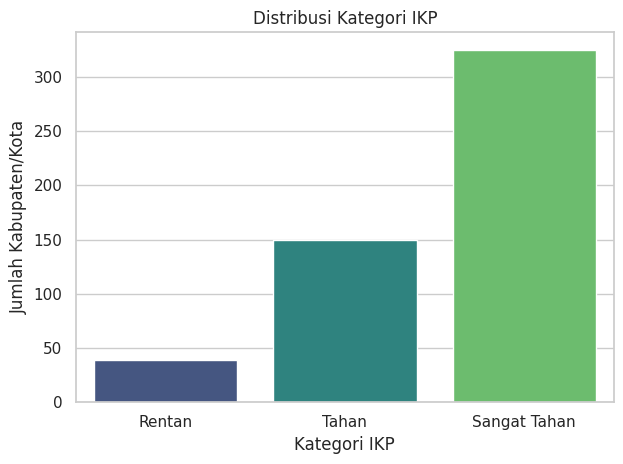

In [14]:
sns.countplot(data=final_data, x='KATEGORI', hue='KATEGORI', order=KATEGORI_ORDER,
              palette='viridis', legend=False)
plt.title('Distribusi Kategori IKP')
plt.xlabel('Kategori IKP')
plt.ylabel('Jumlah Kabupaten/Kota')
plt.tight_layout()
plt.show()


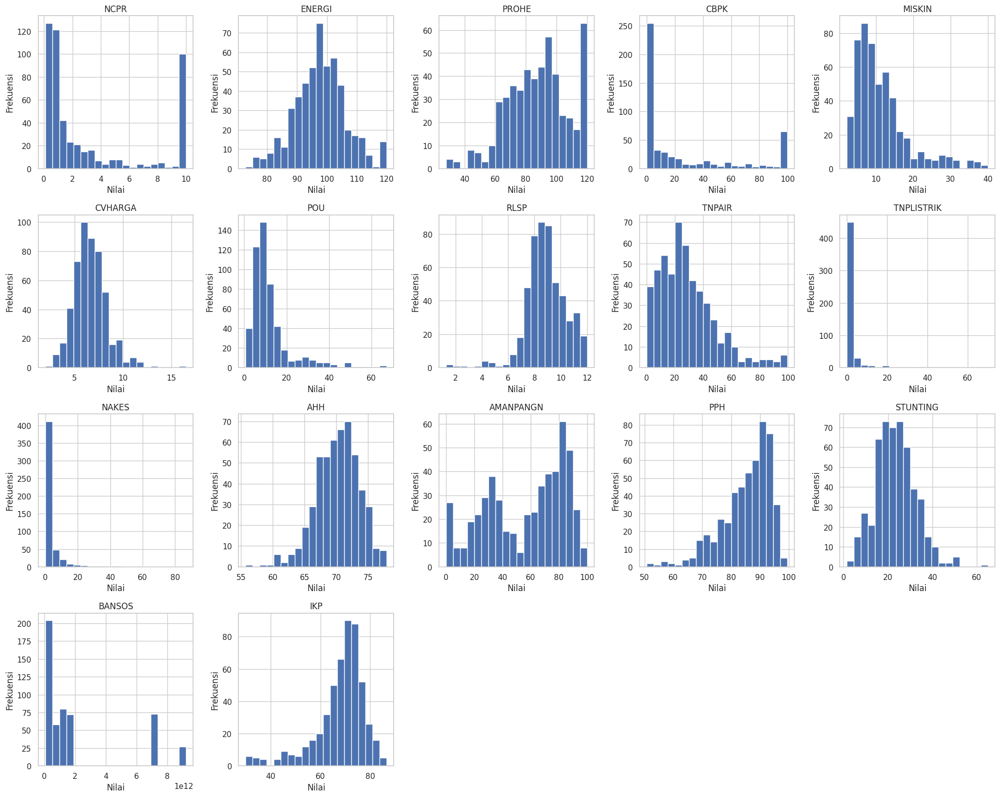

In [15]:
fig, axes = plt.subplots(4, 5, figsize=(20, 16))
for ax, col in zip(axes.flat, KOLOM_NUMERIK_LENGKAP):
    ax.hist(final_data[col].dropna(), bins=20)
    ax.set_title(col)
    ax.set_xlabel("Nilai")
    ax.set_ylabel("Frekuensi")
for ax in axes.flat[len(KOLOM_NUMERIK_LENGKAP):]:
    ax.axis('off')
plt.tight_layout()
plt.show()


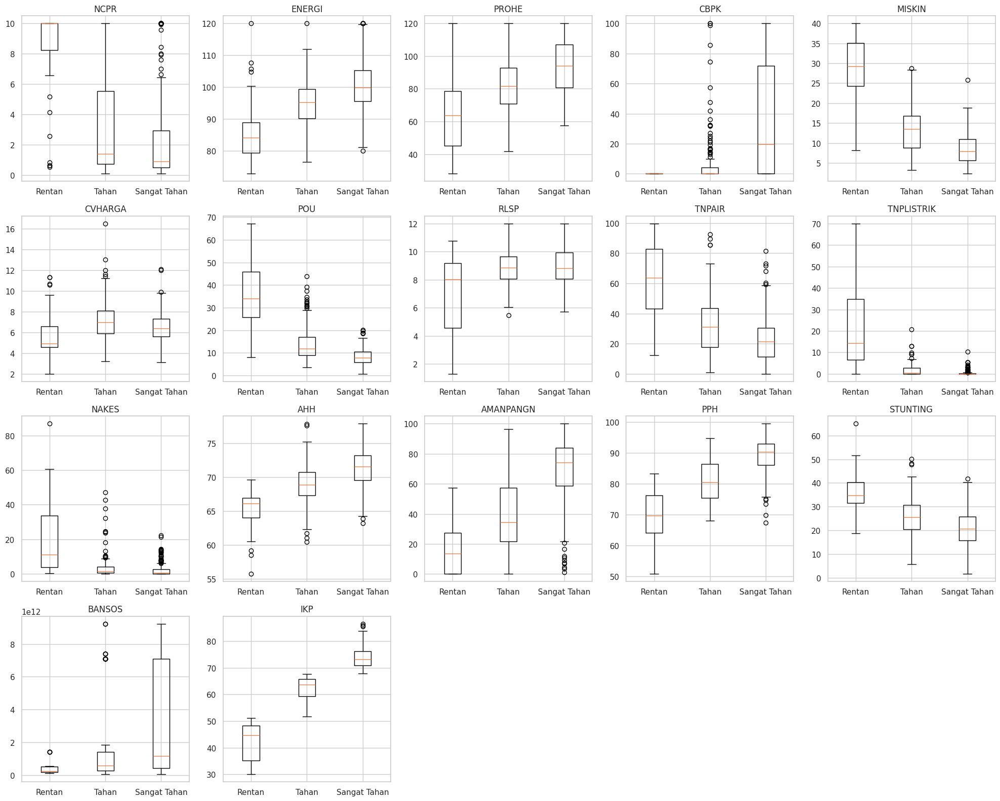

In [16]:
fig, axes = plt.subplots(4, 5, figsize=(20, 16))
for ax, col in zip(axes.flat, KOLOM_NUMERIK_LENGKAP):
    data_per_kategori = [
        final_data.loc[final_data["KATEGORI"] == k, col].dropna() for k in KATEGORI_ORDER
    ]
    ax.boxplot(data_per_kategori, tick_labels=KATEGORI_ORDER)
    ax.set_title(col)
for ax in axes.flat[len(KOLOM_NUMERIK_LENGKAP):]:
    ax.axis('off')
plt.tight_layout()
plt.show()


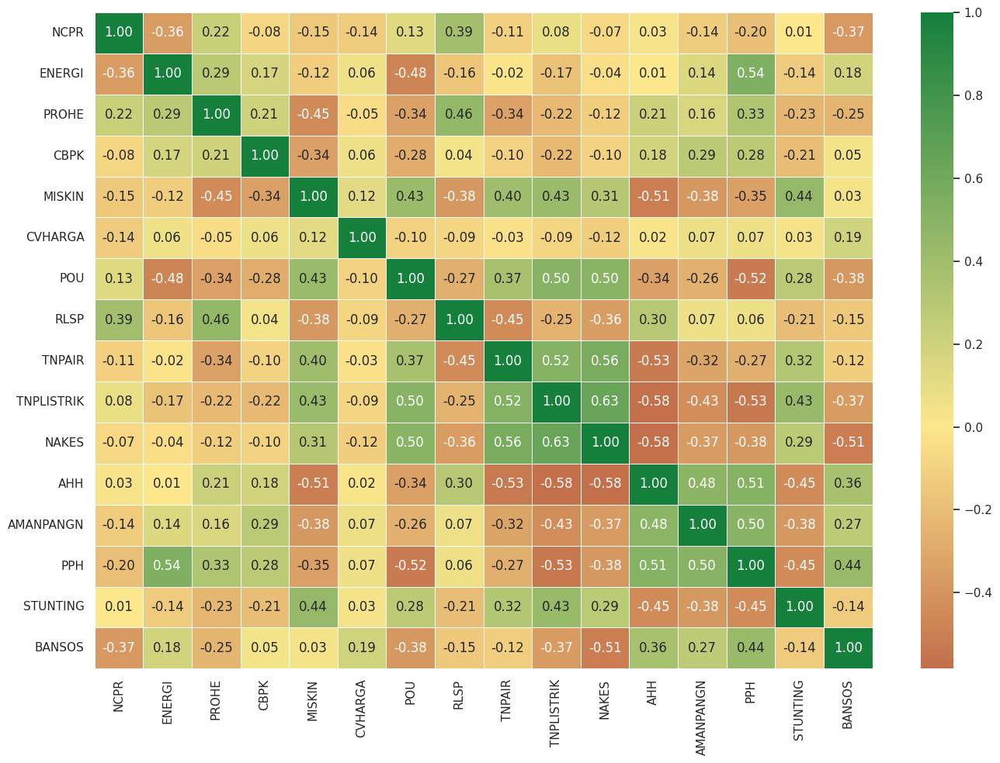

In [17]:
corr_matrix = final_data[KOLOM_PREDIKTOR].corr(method='spearman')

plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap=CMAP_HIJAU_KE_MERAH, linewidths=0.5, center=0)
plt.tight_layout()
plt.savefig('heatmap.png', dpi=300)
plt.show()


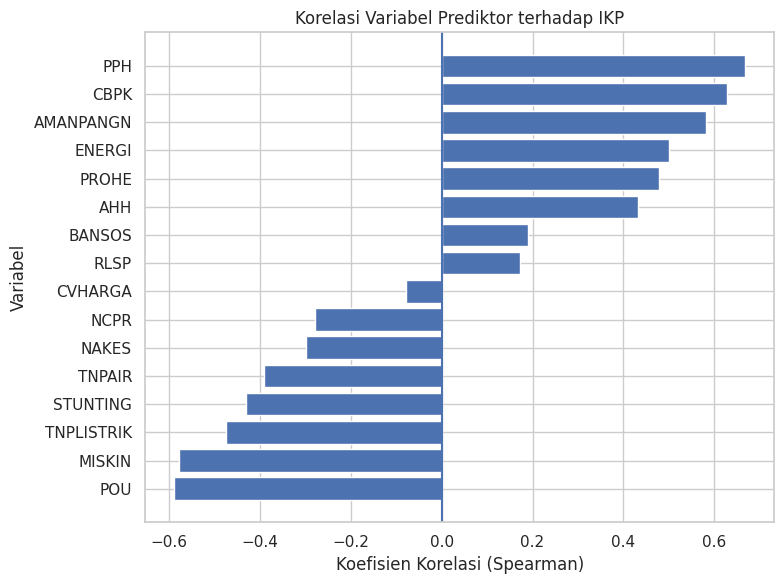

In [18]:
corr_ikp = final_data[KOLOM_NUMERIK_LENGKAP].corr(method='spearman')[["IKP"]].drop("IKP").sort_values("IKP")

plt.figure(figsize=(8, 6))
plt.barh(corr_ikp.index, corr_ikp["IKP"])
plt.axvline(0)
plt.xlabel("Koefisien Korelasi (Spearman)")
plt.ylabel("Variabel")
plt.title("Korelasi Variabel Prediktor terhadap IKP")
plt.tight_layout()
plt.show()


In [19]:
# Variance Inflation Factor (VIF) -- cek multikolinearitas antar prediktor
X_vif = add_constant(final_data[KOLOM_PREDIKTOR])
vif_data = pd.DataFrame({
    "variable": X_vif.columns,
    "VIF": [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])],
})
vif_data = vif_data[vif_data['variable'] != 'const'].reset_index(drop=True)
display(vif_data.round(2))


/usr/local/lib/python3.12/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


,variable,VIF
0,NCPR,1.71
1,ENERGI,2.66
2,PROHE,2.34
3,CBPK,1.24
4,MISKIN,2.85
5,CVHARGA,1.09
6,POU,3.10
7,RLSP,2.65
8,TNPAIR,2.00
9,TNPLISTRIK,2.53


# 7. Analisis Deskriptif

Fungsi `plot_variabel_provinsi()` menggantikan **15 blok kode yang identik** di notebook asli
(1 bar chart rata-rata per provinsi + 1 peta choropleth, untuk tiap variabel).
Sekarang cukup dipanggil sekali per variabel dalam satu loop.


In [20]:
gdf_prov = final_data.dissolve(by="Provinsi", as_index=False)

/tmp/ipykernel_1871/3101214636.py:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


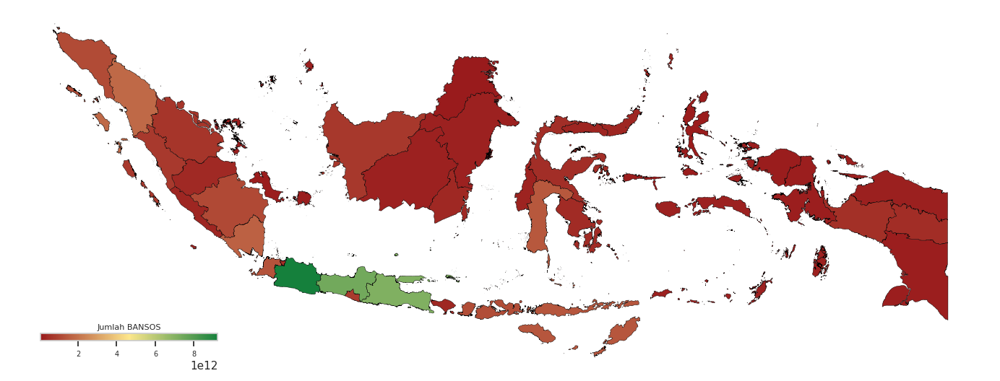

In [21]:
# 2. Peta choropleth per kabupaten/kota
fig, ax = plt.subplots(figsize=(14, 8))

ax_legend = inset_axes(
    ax, width="18%", height="2%", loc='lower left',
    borderpad=3  # jarak legend dari tepi kiri-bawah peta
)

gdf_prov.plot(
    column='BANSOS', ax=ax, cmap=CMAP_HIJAU_KE_MERAH, linewidth=0.3, edgecolor='black',
    legend=True, cax=ax_legend,
    legend_kwds={'label': '', 'orientation': 'horizontal'},
)

ax_legend.xaxis.set_label_position('top')
ax_legend.tick_params(labelsize=7)
ax_legend.set_title('Jumlah BANSOS', fontsize=8, pad=4)  # opsional, judul di atas colorbar
ax_legend.set_ylabel('')  # kalau label lama masih nempel

ax.set_axis_off()
plt.tight_layout()
plt.savefig('ban_peta.png', dpi=300, bbox_inches='tight')
plt.show()

In [22]:
tabel_deskriptif = final_data[KOLOM_PREDIKTOR].describe().T[["count", "mean", "std", "min", "50%", "max"]]
tabel_deskriptif.columns = ["N", "MEAN", "STD. DEV", "MIN", "MEDIAN", "MAX"]
display(tabel_deskriptif.round(2))
tabel_deskriptif.round(2).to_excel('tabel_deskriptif.xlsx')


,N,MEAN,STD. DEV,MIN,MEDIAN,MAX
NCPR,514.0,3.260000e+00,3.700000e+00,9.000000e-02,1.120000e+00,1.000000e+01
ENERGI,514.0,9.787000e+01,8.610000e+00,7.280000e+01,9.800000e+01,1.200000e+02
PROHE,514.0,8.789000e+01,1.997000e+01,2.800000e+01,8.905000e+01,1.200000e+02
CBPK,514.0,2.549000e+01,3.570000e+01,0.000000e+00,5.150000e+00,1.000000e+02
MISKIN,514.0,1.150000e+01,7.160000e+00,2.300000e+00,9.650000e+00,4.000000e+01
CVHARGA,514.0,6.610000e+00,1.690000e+00,2.000000e+00,6.500000e+00,1.650000e+01
POU,514.0,1.206000e+01,9.700000e+00,7.000000e-01,9.200000e+00,6.720000e+01
RLSP,514.0,8.850000e+00,1.540000e+00,1.280000e+00,8.800000e+00,1.200000e+01
TNPAIR,514.0,2.869000e+01,2.005000e+01,0.000000e+00,2.505000e+01,9.960000e+01
TNPLISTRIK,514.0,2.380000e+00,8.030000e+00,0.000000e+00,1.100000e-01,7.003000e+01


In [23]:
def plot_variabel_provinsi(gdf: gpd.GeoDataFrame, kolom: str, label: str,
                            cmap=CMAP_MERAH_KE_HIJAU, simpan_prefix: str | None = None):
    """Menampilkan (1) bar chart rata-rata per provinsi dan (2) peta choropleth per kab/kota."""
    prefix = simpan_prefix or kolom.lower()

    # 1. Bar chart rata-rata per provinsi
    rata_provinsi = gdf.groupby('Provinsi')[kolom].mean().sort_values(ascending=False).reset_index()
    plt.figure(figsize=(12, 10))
    sns.barplot(data=rata_provinsi, y='Provinsi', x=kolom, color='#23c65d', edgecolor='black')
    plt.xlabel(f'Rata-rata {label}')
    plt.ylabel('Provinsi')
    plt.tight_layout()
    plt.savefig(f'{prefix}_provinsi.png', dpi=300)
    plt.show()
    
    # 2. Peta choropleth per kabupaten/kota
    fig, ax = plt.subplots(figsize=(14, 8))

    ax_legend = inset_axes(
        ax, width="18%", height="2%", loc='lower left',
        borderpad=3  # jarak legend dari tepi kiri-bawah peta
    )

    gdf.plot(
        column=kolom, ax=ax, cmap=cmap, linewidth=0.3, edgecolor='black',
        legend=True, cax=ax_legend,
        legend_kwds={'label': '', 'orientation': 'horizontal'},
    )

    ax_legend.xaxis.set_label_position('top')
    ax_legend.tick_params(labelsize=7)
    ax_legend.set_title(label, fontsize=8, pad=4)  # opsional, judul di atas colorbar
    ax_legend.set_ylabel('')  # kalau label lama masih nempel

    ax.set_axis_off()
    plt.tight_layout()
    plt.savefig(f'{prefix}_peta.png', dpi=300, bbox_inches='tight')
    plt.show()
    # # 2. Peta choropleth per kabupaten/kota
    # fig, ax = plt.subplots(figsize=(14, 8))
    # ax_legend = inset_axes(ax, width="30%", height="3%", loc='lower left',
    #                        bbox_to_anchor=(0.05, 0.05, 1, 1), bbox_transform=ax.transAxes)
    # gdf.plot(
    #     column=kolom, ax=ax, cmap=cmap, linewidth=0.3, edgecolor='black',
    #     legend=True, cax=ax_legend, legend_kwds={'label': label, 'orientation': 'horizontal'},
    # )
    # ax_legend.xaxis.set_label_position('top')
    # ax.set_axis_off()
    # plt.tight_layout()
    # plt.savefig(f'{prefix}_peta.png', dpi=300)
    # plt.show()


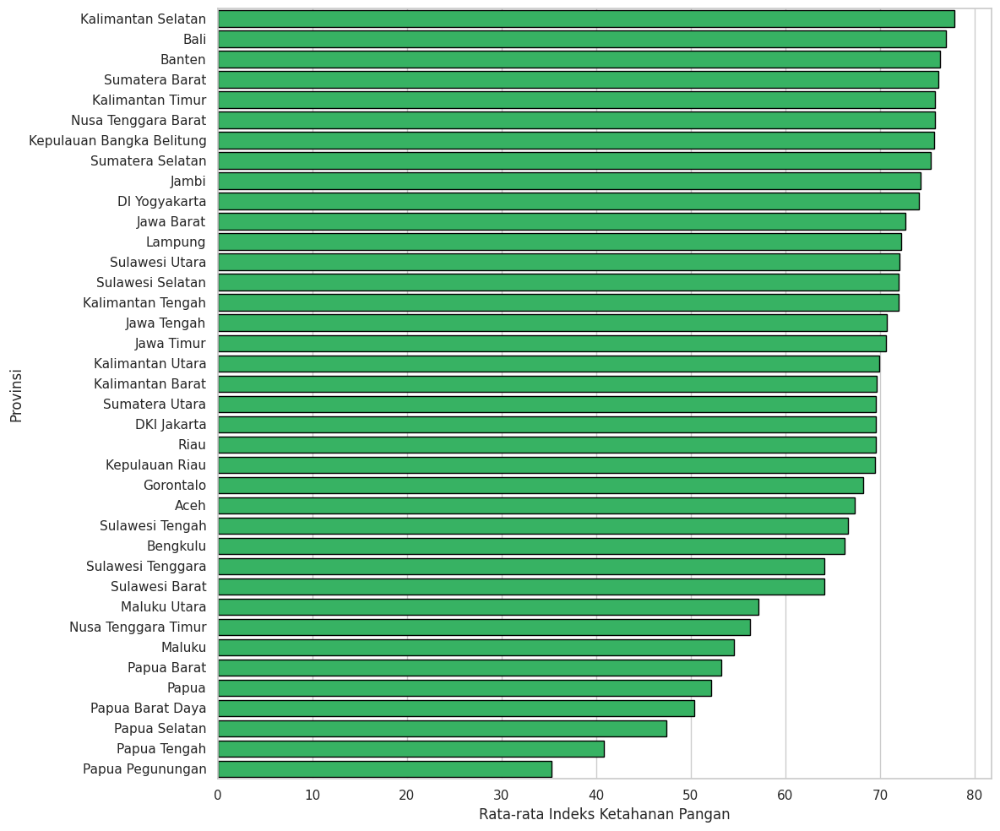

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


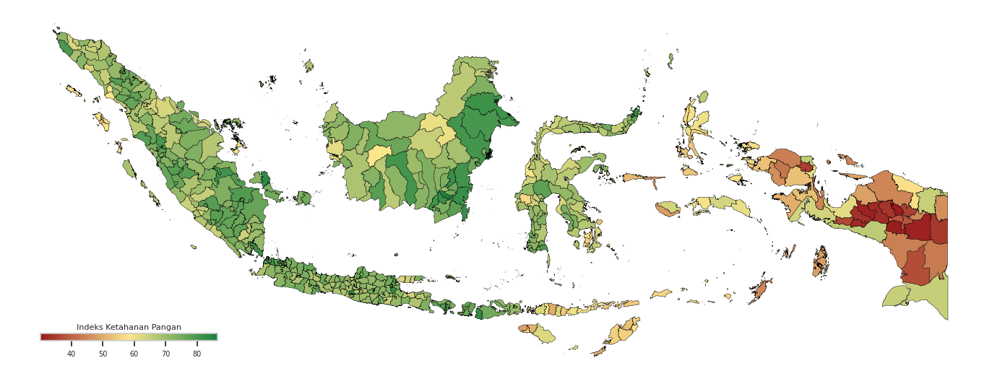

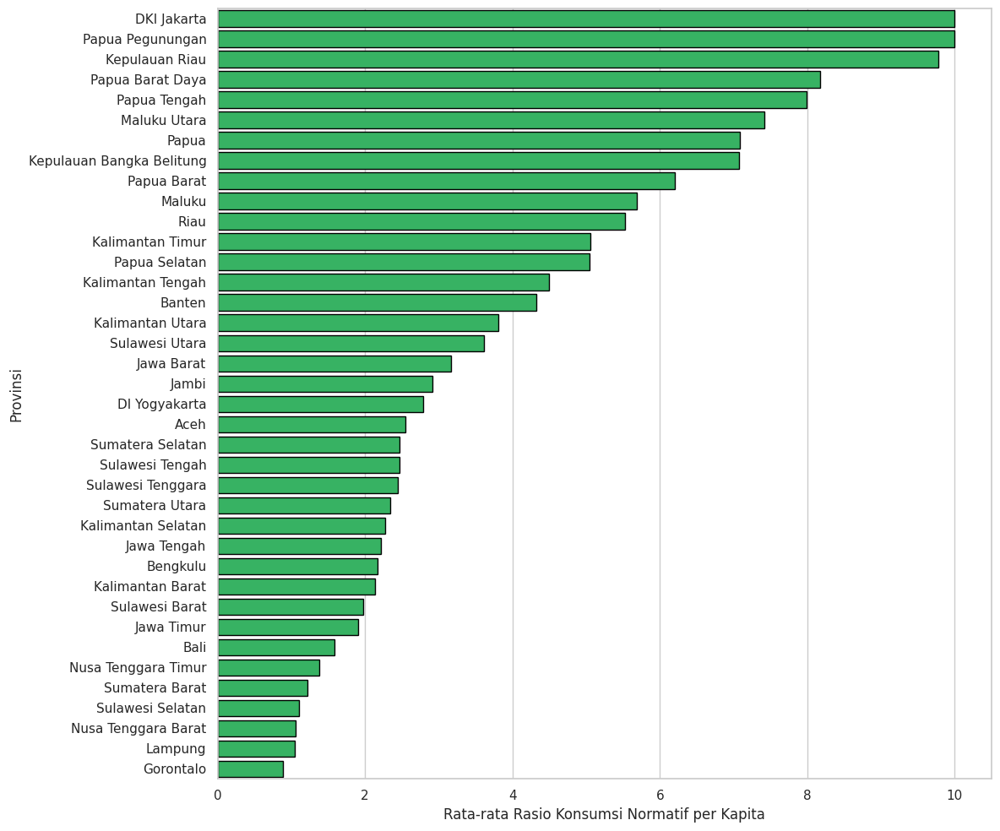

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


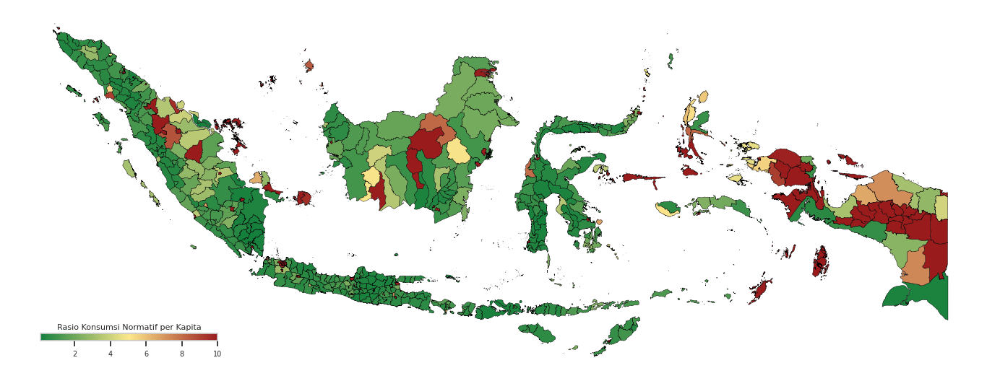

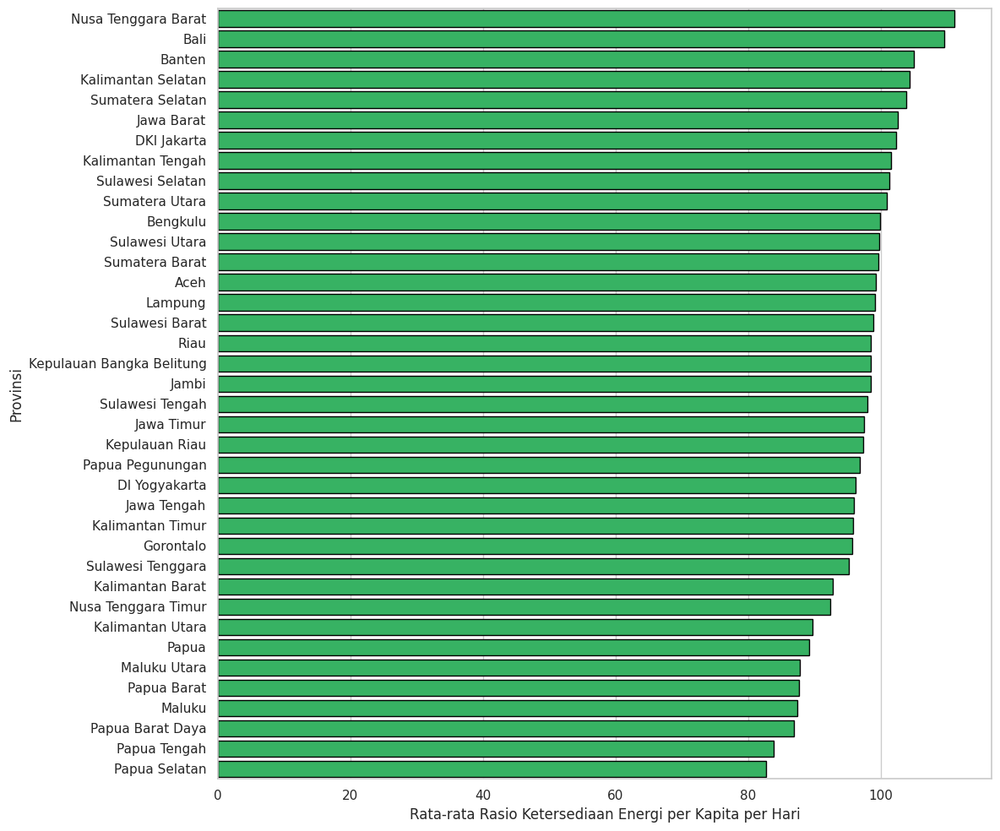

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


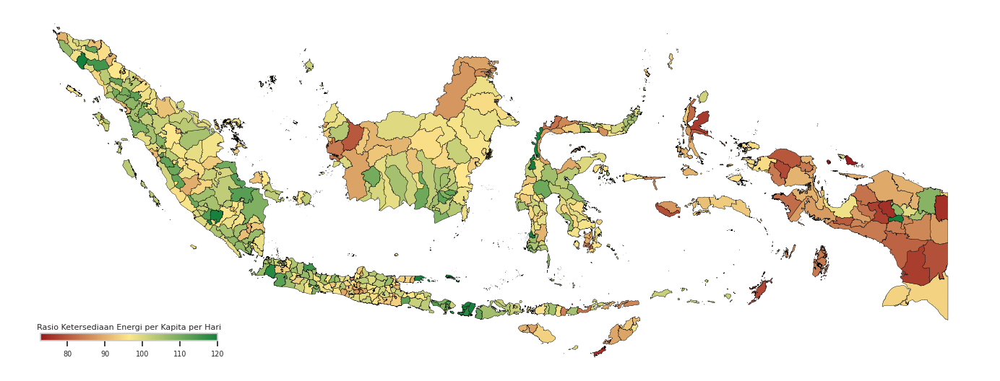

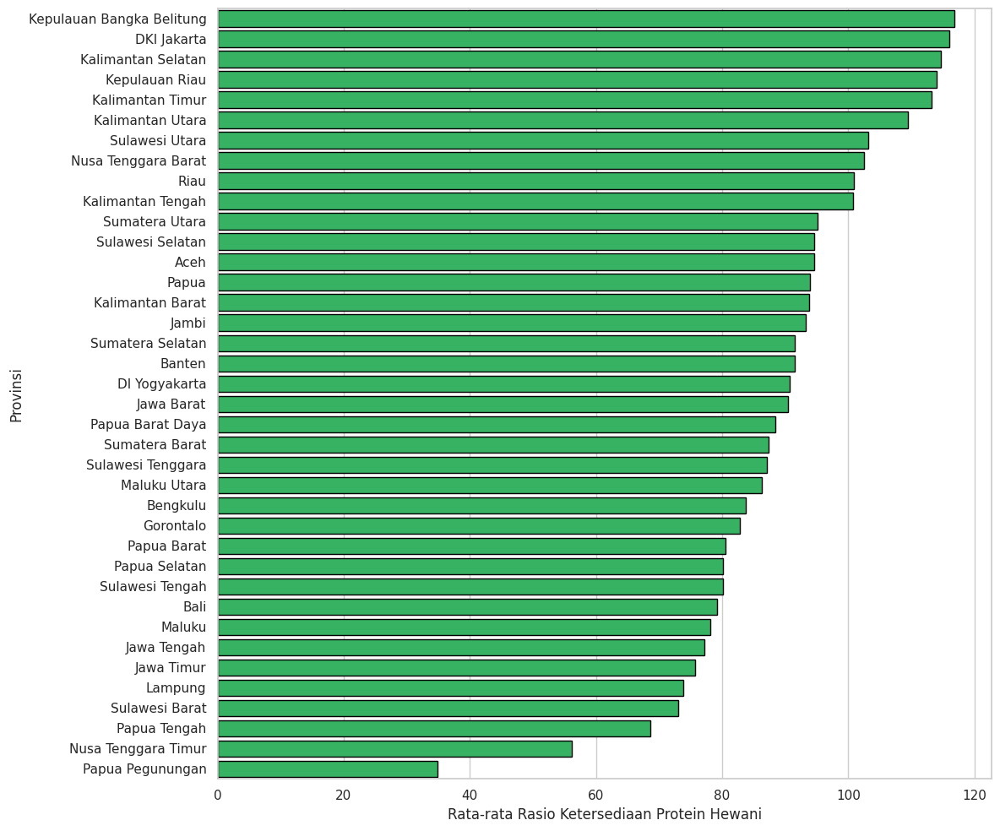

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


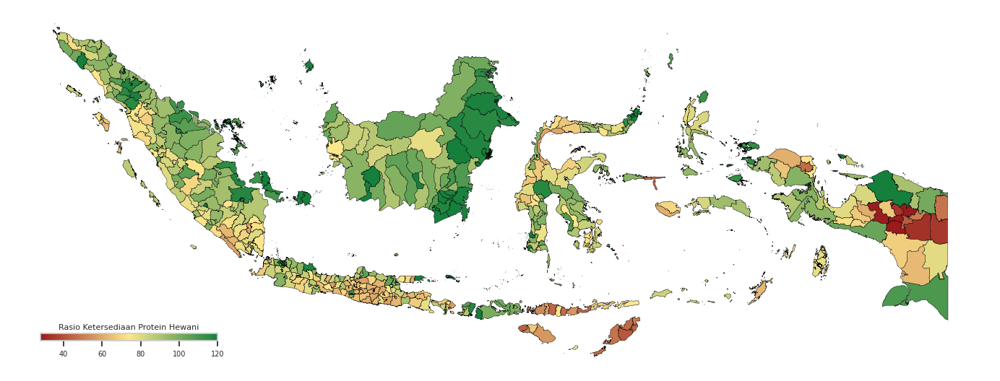

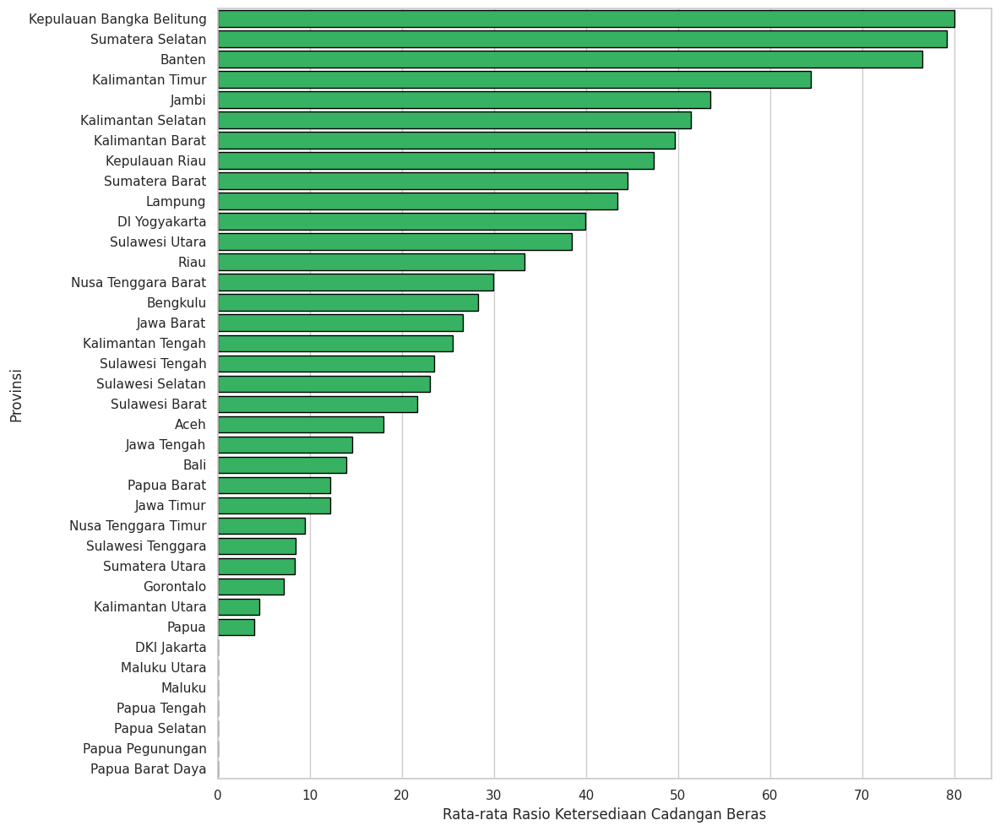

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


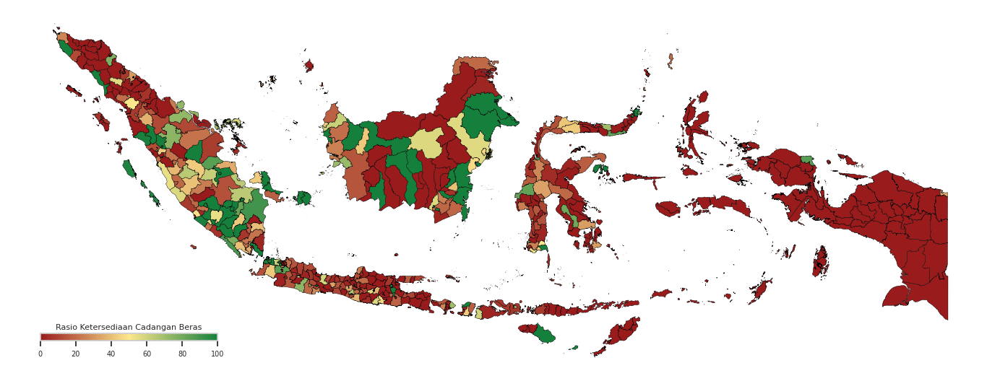

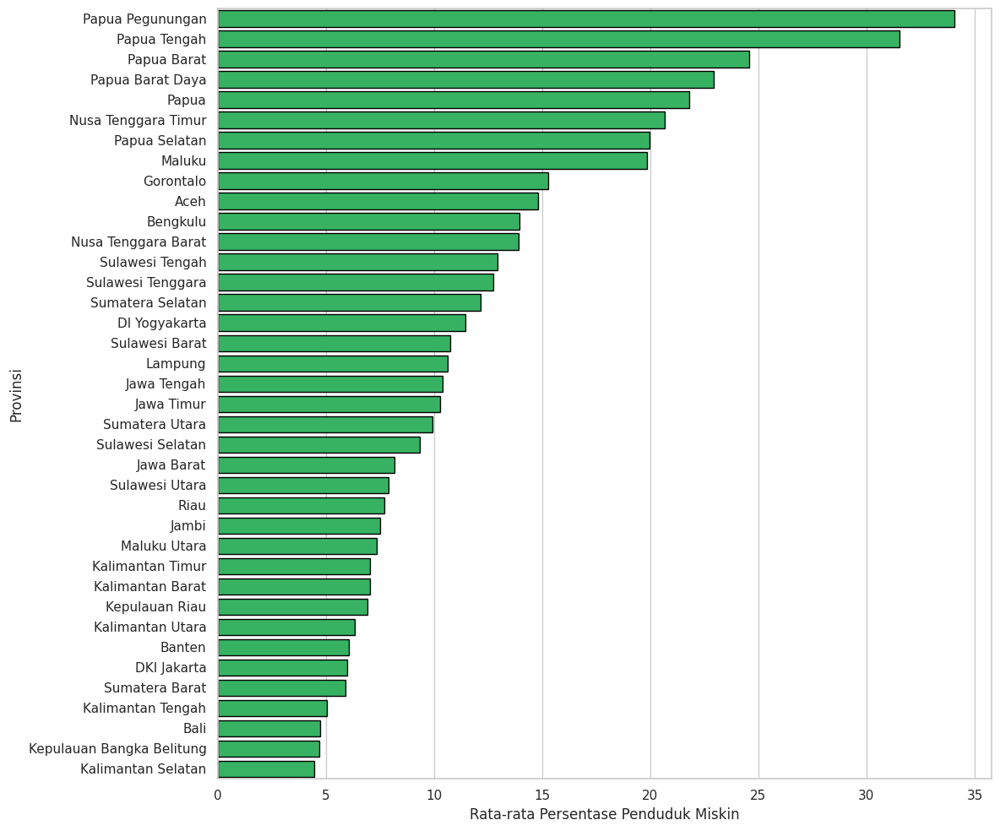

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


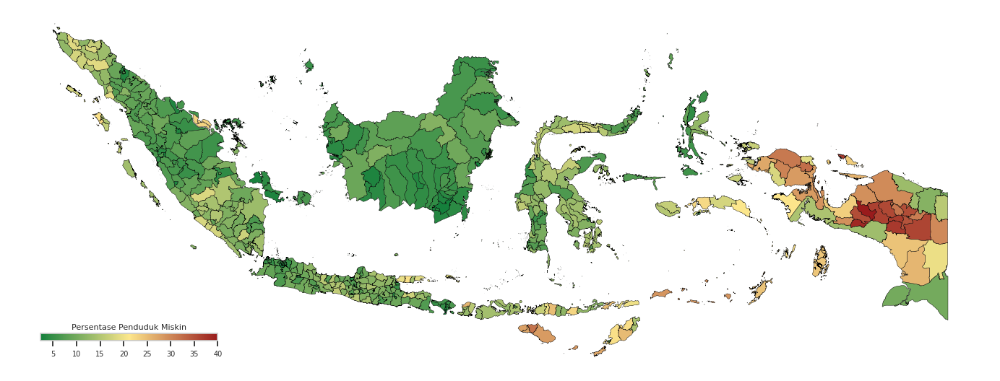

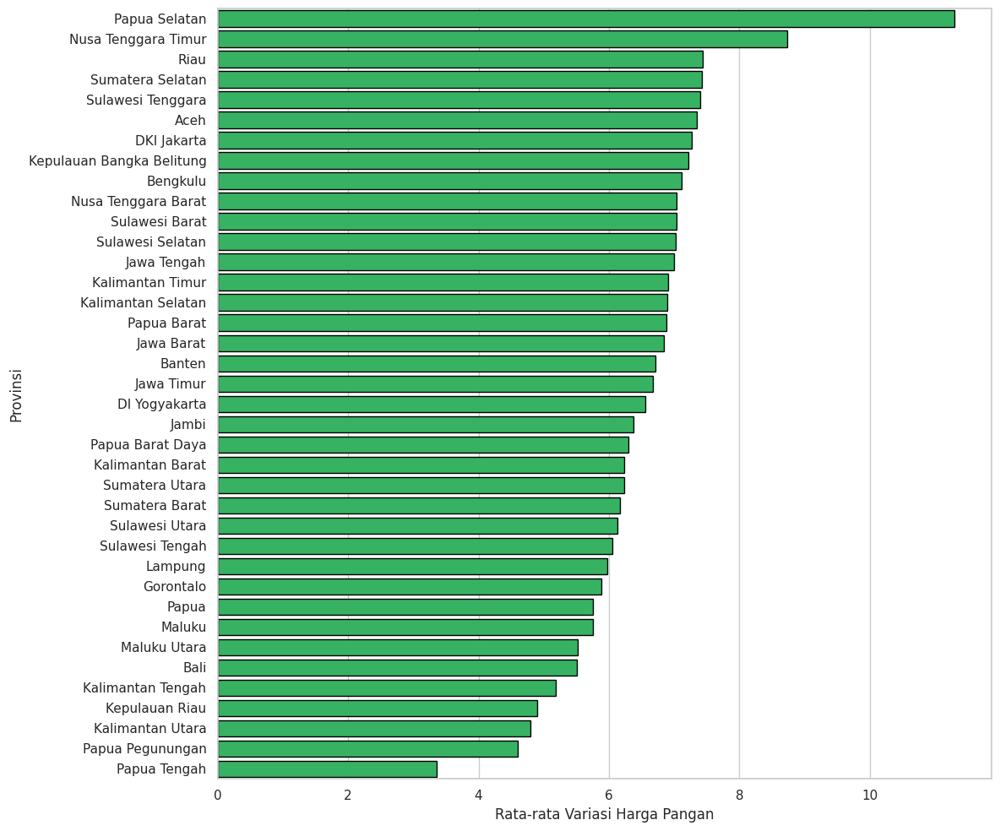

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


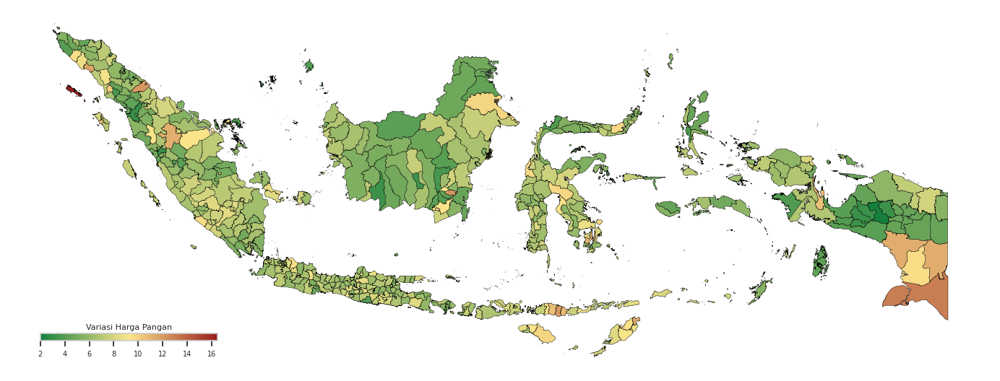

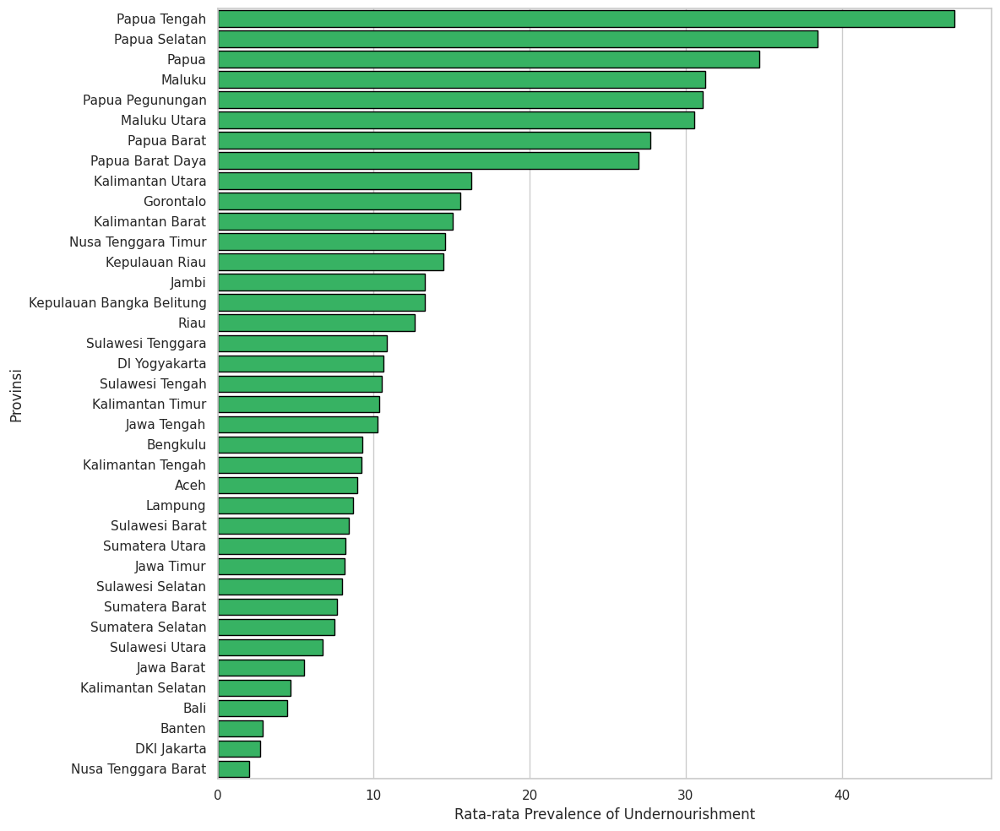

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


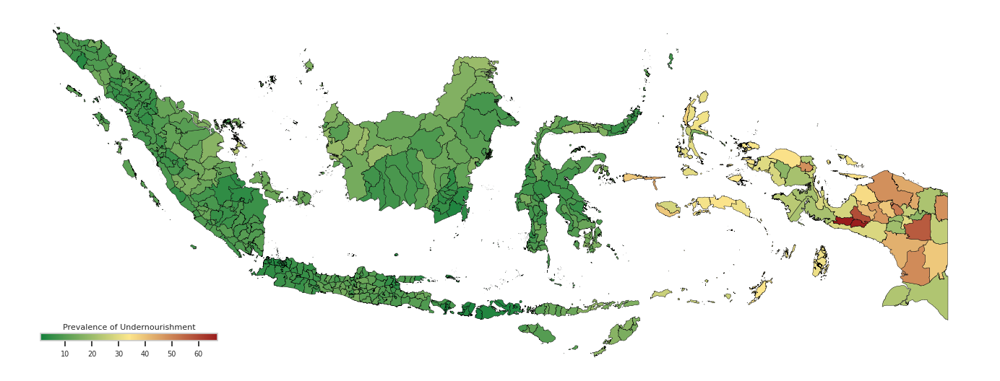

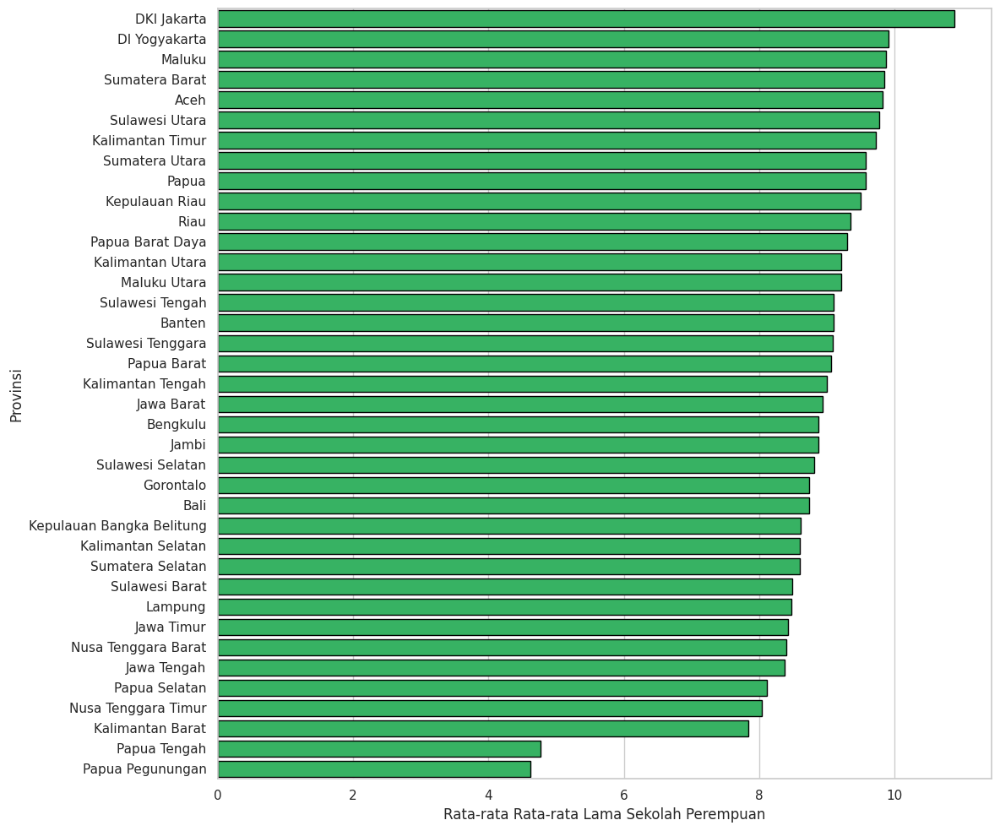

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


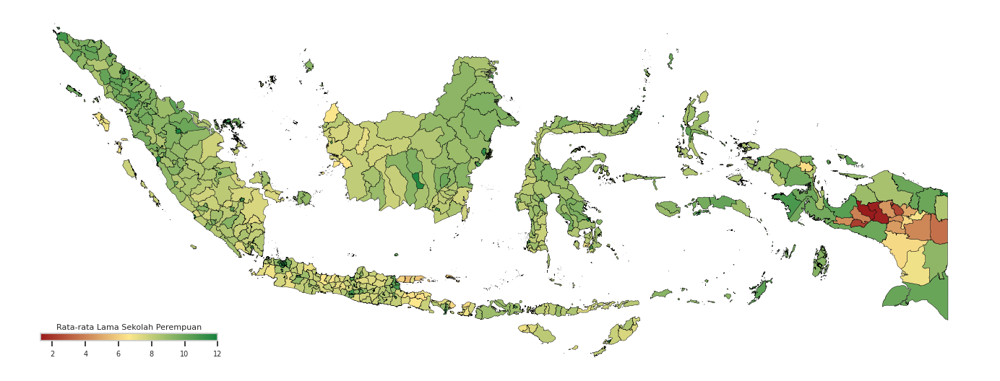

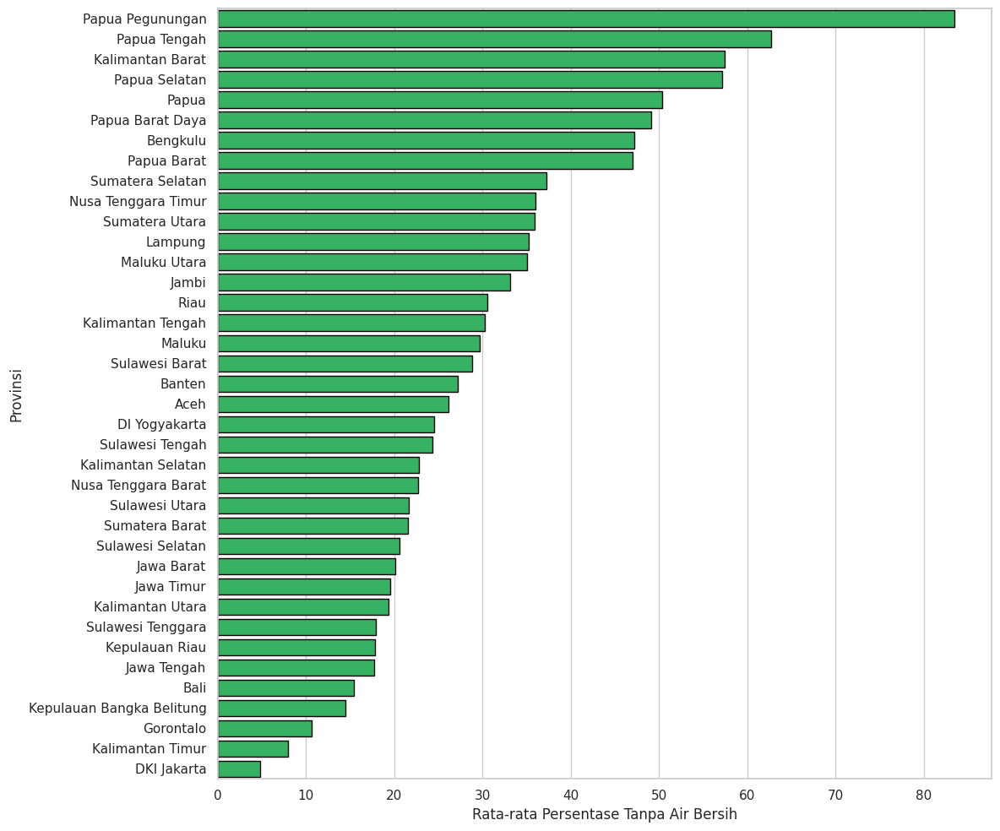

/tmp/ipykernel_1871/3827986981.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


In [ ]:
# IKP menggunakan skema warna terbalik (hijau = baik), variabel lain memakai skema
# "merah = buruk" secara default kecuali beberapa yang justru baik jika tinggi.
VARIABEL_SKALA_POSITIF = {"ENERGI", "PROHE", "CBPK", "RLSP", "AMANPANGN", "AHH", "PPH"}

plot_variabel_provinsi(final_data, "IKP", LABEL_VARIABEL["IKP"], cmap=CMAP_HIJAU_KE_MERAH, simpan_prefix="ikp")

for kolom in KOLOM_PREDIKTOR:
    cmap = CMAP_HIJAU_KE_MERAH if kolom in VARIABEL_SKALA_POSITIF else CMAP_MERAH_KE_HIJAU
    plot_variabel_provinsi(final_data, kolom, LABEL_VARIABEL[kolom], cmap=cmap)


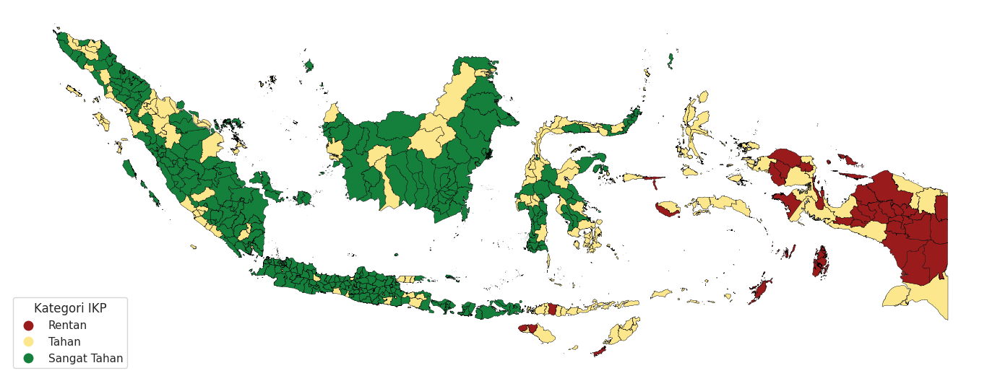

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
final_data.plot(
    column='KATEGORI', ax=ax, cmap=CMAP_HIJAU_KE_MERAH, linewidth=0.3, edgecolor='black',
    legend=True, legend_kwds={'title': "Kategori IKP", 'loc': 'lower left'},
)
ax.set_axis_off()
plt.tight_layout()
plt.savefig('ikp_kategori.png', dpi=300)
plt.show()


# 8. Analisis Spasial

### 8.1 Pembobotan Spasial (Queen Contiguity + Penanganan Wilayah Terisolasi)

In [ ]:
# # --- Bobot spasial UNTUK MORAN'S I: row-standardized ---
# w = lps.weights.Queen.from_dataframe(final_data)
# w.transform = 'r'

# if len(w.islands) > 0:
#     print(f"Ditemukan {len(w.islands)} kabupaten/kota tanpa tetangga:")
#     display(final_data.iloc[w.islands][['Kabupaten/Kota', 'Provinsi']])

# # --- Bobot spasial UNTUK MODEL CAR: matriks biner (0/1), TIDAK row-standardized ---
# # pm.CAR mensyaratkan W simetris & biner — row-standardization merusak simetri karena
# # tiap baris dibagi jumlah tetangganya sendiri (baris i dan kolom i jadi tidak simetris lagi).
# w_car = lps.weights.Queen.from_dataframe(final_data)  # transform tetap default 'B' (biner)
# W_sym, id_wilayah = w_car.full()
# np.fill_diagonal(W_sym, 0)

# isolated_nodes = np.where(W_sym.sum(axis=1) == 0)[0]
# if len(isolated_nodes) > 0:
#     w_knn = lps.weights.KNN.from_dataframe(final_data, k=1)
#     W_knn, _ = w_knn.full()
#     for i in isolated_nodes:
#         tetangga_terdekat = np.where(W_knn[i] == 1)[0][0]
#         W_sym[i, tetangga_terdekat] = 1
#         W_sym[tetangga_terdekat, i] = 1
#         print(f"- Menghubungkan {final_data['Kabupaten/Kota'].iloc[i]} dengan "
#               f"{final_data['Kabupaten/Kota'].iloc[tetangga_terdekat]}")

# # Pastikan benar-benar simetris & biner sebelum dipakai di pm.CAR
# assert np.array_equal(W_sym, W_sym.T), "W_sym tidak simetris!"
# assert set(np.unique(W_sym)).issubset({0.0, 1.0}), "W_sym harus biner (0/1)!"

# print("Matriks bobot spasial W_sym (biner, simetris) siap digunakan di model CAR.")

/tmp/ipykernel_871/1596907552.py:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = lps.weights.Queen.from_dataframe(final_data)


('WARNING: ', 8, ' is an island (no neighbors)')
('WARNING: ', 19, ' is an island (no neighbors)')
('WARNING: ', 64, ' is an island (no neighbors)')
('WARNING: ', 84, ' is an island (no neighbors)')
('WARNING: ', 148, ' is an island (no neighbors)')
('WARNING: ', 149, ' is an island (no neighbors)')
('WARNING: ', 150, ' is an island (no neighbors)')
('WARNING: ', 151, ' is an island (no neighbors)')
('WARNING: ', 152, ' is an island (no neighbors)')
('WARNING: ', 154, ' is an island (no neighbors)')
('WARNING: ', 296, ' is an island (no neighbors)')
('WARNING: ', 304, ' is an island (no neighbors)')
('WARNING: ', 305, ' is an island (no neighbors)')
('WARNING: ', 311, ' is an island (no neighbors)')
('WARNING: ', 369, ' is an island (no neighbors)')
('WARNING: ', 372, ' is an island (no neighbors)')
('WARNING: ', 373, ' is an island (no neighbors)')
('WARNING: ', 378, ' is an island (no neighbors)')
('WARNING: ', 391, ' is an island (no neighbors)')
('WARNING: ', 395, ' is an island (n

/usr/local/lib/python3.12/dist-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 53 disconnected components.
 There are 33 islands with ids: 8, 19, 64, 84, 148, 149, 150, 151, 152, 154, 296, 304, 305, 311, 369, 372, 373, 378, 391, 395, 398, 428, 433, 452, 453, 457, 458, 461, 466, 468, 469, 470, 473.
  W.__init__(self, neighbors, ids=ids, **kw)


,Kabupaten/Kota,Provinsi
8,Simeulue,Aceh
19,Kota Sabang,Aceh
64,Kepulauan Mentawai,Sumatera Barat
84,Kepulauan Meranti,Riau
148,Karimun,Kepulauan Riau
149,Natuna,Kepulauan Riau
150,Lingga,Kepulauan Riau
151,Kepulauan Anambas,Kepulauan Riau
152,Kota Batam,Kepulauan Riau
154,Adm. Kep. Seribu,DKI Jakarta


/tmp/ipykernel_871/1596907552.py:12: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w_car = lps.weights.Queen.from_dataframe(final_data)  # transform tetap default 'B' (biner)
/usr/local/lib/python3.12/dist-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 53 disconnected components.
 There are 33 islands with ids: 8, 19, 64, 84, 148, 149, 150, 151, 152, 154, 296, 304, 305, 311, 369, 372, 373, 378, 391, 395, 398, 428, 433, 452, 453, 457, 458, 461, 466, 468, 469, 470, 473.
  W.__init__(self, neighbors, ids=ids, **kw)


- Menghubungkan Simeulue dengan Aceh Barat Daya
- Menghubungkan Kota Sabang dengan Kota Banda Aceh
- Menghubungkan Kepulauan Mentawai dengan Kota Padang
- Menghubungkan Kepulauan Meranti dengan Siak
- Menghubungkan Karimun dengan Kota Batam
- Menghubungkan Natuna dengan Kepulauan Anambas
- Menghubungkan Lingga dengan Kota Tanjung Pinang
- Menghubungkan Kepulauan Anambas dengan Natuna
- Menghubungkan Kota Batam dengan Kota Tanjung Pinang
- Menghubungkan Adm. Kep. Seribu dengan Tangerang
- Menghubungkan Alor dengan Belu
- Menghubungkan Lembata dengan Flores Timur
- Menghubungkan Rote Ndao dengan Kota Kupang
- Menghubungkan Sabu Raijua dengan Rote Ndao
- Menghubungkan Kota Tarakan dengan Tana Tidung
- Menghubungkan Kepulauan Sangihe dengan Kep. Siau Tagulandang Biaro
- Menghubungkan Kepulauan Talaud dengan Kepulauan Sangihe
- Menghubungkan Kep. Siau Tagulandang Biaro dengan Kepulauan Sangihe
- Menghubungkan Banggai Kepulauan dengan Banggai Laut
- Menghubungkan Banggai Laut dengan Banggai 

/usr/local/lib/python3.12/dist-packages/libpysal/weights/distance.py:153: UserWarning: The weights matrix is not fully connected: 
 There are 148 disconnected components.
  W.__init__(self, neighbors, id_order=ids, **kwargs)


In [ ]:
# ============================================================
# 1. Queen Contiguity
# ============================================================
w_queen = lps.weights.Queen.from_dataframe(final_data)

# ============================================================
# 2. Tambahkan KNN (k=1) hanya untuk wilayah yang tidak punya tetangga
# ============================================================
w_knn = lps.weights.KNN.from_dataframe(final_data, k=1)

# Matriks biner Queen
W_sym, ids = w_queen.full()
np.fill_diagonal(W_sym, 0)

# Cari pulau (islands)
isolated_nodes = np.where(W_sym.sum(axis=1) == 0)[0]

if len(isolated_nodes) > 0:
    W_knn, _ = w_knn.full()

    print(f"Menambahkan {len(isolated_nodes)} koneksi KNN...")

    for i in isolated_nodes:

        j = np.where(W_knn[i] == 1)[0][0]

        # Tambahkan edge secara simetris
        W_sym[i, j] = 1
        W_sym[j, i] = 1

        print(
            f"- {final_data.iloc[i]['Kabupaten/Kota']} "
            f"<--> "
            f"{final_data.iloc[j]['Kabupaten/Kota']}"
        )

# ============================================================
# 3. Pastikan matriks valid untuk CAR
# ============================================================
assert np.array_equal(W_sym, W_sym.T)
assert set(np.unique(W_sym)).issubset({0.0, 1.0})

print("W_sym siap digunakan pada pm.CAR")

/tmp/ipykernel_871/3673914085.py:4: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w_queen = lps.weights.Queen.from_dataframe(final_data)
/usr/local/lib/python3.12/dist-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 53 disconnected components.
 There are 33 islands with ids: 8, 19, 64, 84, 148, 149, 150, 151, 152, 154, 296, 304, 305, 311, 369, 372, 373, 378, 391, 395, 398, 428, 433, 452, 453, 457, 458, 461, 466, 468, 469, 470, 473.
  W.__init__(self, neighbors, ids=ids, **kw)


Menambahkan 33 koneksi KNN...
- Simeulue <--> Aceh Barat Daya
- Kota Sabang <--> Kota Banda Aceh
- Kepulauan Mentawai <--> Kota Padang
- Kepulauan Meranti <--> Siak
- Karimun <--> Kota Batam
- Natuna <--> Kepulauan Anambas
- Lingga <--> Kota Tanjung Pinang
- Kepulauan Anambas <--> Natuna
- Kota Batam <--> Kota Tanjung Pinang
- Adm. Kep. Seribu <--> Tangerang
- Alor <--> Belu
- Lembata <--> Flores Timur
- Rote Ndao <--> Kota Kupang
- Sabu Raijua <--> Rote Ndao
- Kota Tarakan <--> Tana Tidung
- Kepulauan Sangihe <--> Kep. Siau Tagulandang Biaro
- Kepulauan Talaud <--> Kepulauan Sangihe
- Kep. Siau Tagulandang Biaro <--> Kepulauan Sangihe
- Banggai Kepulauan <--> Banggai Laut
- Banggai Laut <--> Banggai Kepulauan
- Kepulauan Selayar <--> Bulukumba
- Wakatobi <--> Buton
- Konawe Kepulauan <--> Kota Kendari
- Maluku Tenggara <--> Kota Tual
- Kepulauan Tanimbar <--> Kota Tual
- Kepulauan Aru <--> Maluku Tenggara
- Maluku Barat Daya <--> Belu
- Kota Tual <--> Maluku Tenggara
- Kepulauan Sula 

/usr/local/lib/python3.12/dist-packages/libpysal/weights/distance.py:153: UserWarning: The weights matrix is not fully connected: 
 There are 148 disconnected components.
  W.__init__(self, neighbors, id_order=ids, **kwargs)


In [ ]:
# Konversi matriks menjadi objek libpysal
w_moran = lps.weights.full2W(W_sym)

# Moran's I menggunakan row-standardization
w_moran.transform = "r"

/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:761: UserWarning: The weights matrix is not fully connected: 
 There are 25 disconnected components.
  return W(neighbors, weights, id_order=ids, **kwargs)


In [ ]:
labels = final_data["Kabupaten/Kota"].astype(str).tolist()

# ==========================================================
# 1. Matriks adjacency biner (untuk CAR)
# ==========================================================
W_binary_df = pd.DataFrame(
    W_sym.astype(int),
    index=labels,
    columns=labels
)

W_binary_df.index.name = "Kabupaten/Kota"
W_binary_df.columns.name = "Kabupaten/Kota"

W_binary_df.to_csv("W_binary_queen_knn_matrix.csv")

# ==========================================================
# 2. Matriks row-standardized (untuk Moran's I)
# ==========================================================
W_row, _ = w_moran.full()

W_row_df = pd.DataFrame(
    W_row,
    index=labels,
    columns=labels
)

W_row_df.index.name = "Kabupaten/Kota"
W_row_df.columns.name = "Kabupaten/Kota"

W_row_df.to_csv("W_row_standardized_matrix.csv")

# ==========================================================
# 3. Edge list
# ==========================================================
edges = []

for i in range(len(labels)):
    for j in range(i + 1, len(labels)):
        if W_sym[i, j] == 1:
            edges.append({
                "kabupaten_kota_1": labels[i],
                "kabupaten_kota_2": labels[j],
                "binary_weight": 1,
                "row_weight_1_to_2": W_row[i, j],
                "row_weight_2_to_1": W_row[j, i]
            })

edges_df = pd.DataFrame(edges)

edges_df.to_csv(
    "W_edges.csv",
    index=False
)

# ==========================================================
# 4. Jumlah tetangga tiap wilayah
# ==========================================================
neighbors_df = pd.DataFrame({
    "Kabupaten/Kota": labels,
    "Jumlah_Tetangga": W_sym.sum(axis=1).astype(int)
})

neighbors_df.to_csv(
    "Jumlah_Tetangga.csv",
    index=False
)

# ==========================================================
# Ringkasan
# ==========================================================
print("=== Ringkasan Bobot Spasial ===")
print(f"Jumlah wilayah        : {len(labels)}")
print(f"Jumlah hubungan unik  : {int(W_sym.sum()/2)}")
print(f"Jumlah elemen bobot   : {int(W_sym.sum())}")
print(f"Rata-rata tetangga    : {W_sym.sum(axis=1).mean():.2f}")

print("\nFile yang disimpan:")
print("1. W_binary_queen_knn_matrix.csv")
print("2. W_row_standardized_matrix.csv")
print("3. W_edges.csv")
print("4. Jumlah_Tetangga.csv")

=== Ringkasan Bobot Spasial ===
Jumlah wilayah        : 514
Jumlah hubungan unik  : 1023
Jumlah elemen bobot   : 2046
Rata-rata tetangga    : 3.98

File yang disimpan:
1. W_binary_queen_knn_matrix.csv
2. W_row_standardized_matrix.csv
3. W_edges.csv
4. Jumlah_Tetangga.csv


In [ ]:
# # Simpan hasil bobot spasial (matriks biner simetris, edge list, dan versi row-standardized)

# labels = final_data["Kabupaten/Kota"].astype(str).tolist()

# # 1) Matriks bobot spasial biner simetris (untuk model CAR)
# W_df = pd.DataFrame(W_sym, index=labels, columns=labels)
# W_df.index.name = "Kabupaten/Kota"
# W_df.columns.name = "Kabupaten/Kota"
# W_df.to_csv("W_sym_matrix.csv", index=True)

# # 2) Edge list / daftar tetangga
# edge_rows = []
# for i in range(len(labels)):
#     for j in range(i + 1, len(labels)):
#         if W_sym[i, j] == 1:
#             edge_rows.append((labels[i], labels[j]))

# pd.DataFrame(edge_rows, columns=["kabupaten_kota_1", "kabupaten_kota_2"]).to_csv(
#     "W_sym_edges.csv", index=False
# )

# # 3) Versi row-standardized (opsional, untuk eksplorasi/visualisasi)
# W_row_std = np.zeros_like(W_sym, dtype=float)
# for i in range(len(labels)):
#     nbrs = np.where(W_sym[i] == 1)[0]
#     if len(nbrs) > 0:
#         W_row_std[i, nbrs] = 1 / len(nbrs)

# pd.DataFrame(W_row_std, index=labels, columns=labels).to_csv(
#     "W_row_standardized_matrix.csv", index=True
# )

# print("Bobot spasial disimpan ke:")
# print("- W_sym_matrix.csv")
# print("- W_sym_edges.csv")
# print("- W_row_standardized_matrix.csv")

In [ ]:
jumlah_bobot = W_sym.sum()
print(f"Jumlah seluruh elemen bobot spasial: {jumlah_bobot}")

### 8.2 Global Moran's I (IKP)

Global Moran's I : 0.7269
Expected E(I)    : -0.0019
Z-Score          : 20.4492
Var              : 0.0013
P-Value          : 0.0000000000


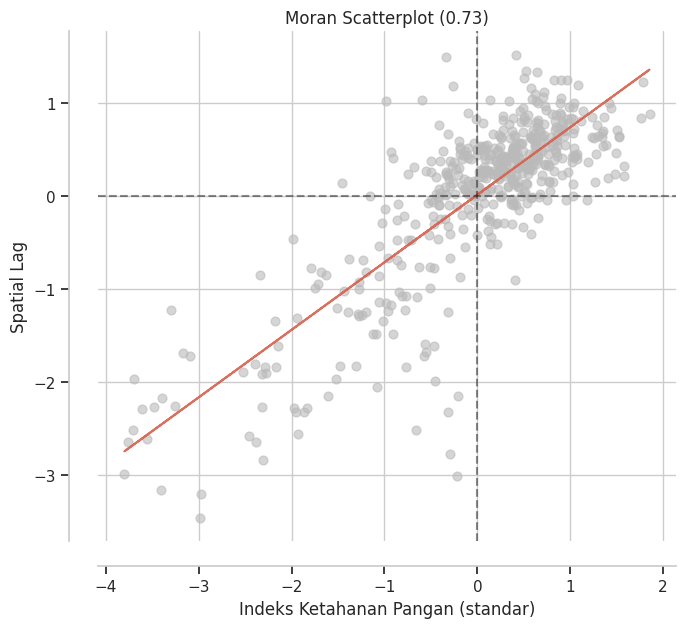

In [ ]:
y_ikp = final_data['IKP'].values
moran_global = Moran(y_ikp, w_moran)

# Safe Moran summary: compute variance if attribute missing
I = moran_global.I
EI = moran_global.EI
z = getattr(moran_global, "z_norm", None)
p = getattr(moran_global, "p_norm", None)

try:
    var_rand = moran_global.var_rand
except AttributeError:
    if z in (None, 0):
        var_rand = np.nan
    else:
        var_rand = ((I - EI) / z) ** 2

print(f"Global Moran's I : {I:.4f}")
print(f"Expected E(I)    : {EI:.4f}")
print(f"Z-Score          : {z:.4f}" if z is not None else "Z-Score          : None")
print(f"Var              : {var_rand:.4f}" if not np.isnan(var_rand) else "Var              : None")
print(f"P-Value          : {p:.10f}" if p is not None else "P-Value          : None")

fig, ax = moran_scatterplot(moran_global)
ax.set_xlabel('Indeks Ketahanan Pangan (standar)')
ax.set_ylabel('Spatial Lag')
plt.tight_layout()
plt.savefig('moran_scatter.png', dpi=300)
plt.show()

In [ ]:
hasil_global_moran = pd.DataFrame(
    {
        "statistic": ["global_moran_i", "expected_ei", "z_score", "p_value", "variance"],
        "value": [I, EI, z, p, var_rand],
    }
)

hasil_global_moran.to_csv("hasil_global_moran.csv", index=False)
display(hasil_global_moran)

print("Hasil Global Moran's I disimpan ke hasil_global_moran.csv")

,statistic,value
0,global_moran_i,7.269141e-01
1,expected_ei,-1.949318e-03
2,z_score,2.044916e+01
3,p_value,6.112259e-93
4,variance,1.270403e-03


Hasil Global Moran's I disimpan ke hasil_global_moran.csv


### 8.3 Local Moran's I / LISA (Deteksi Hotspot-Coldspot)

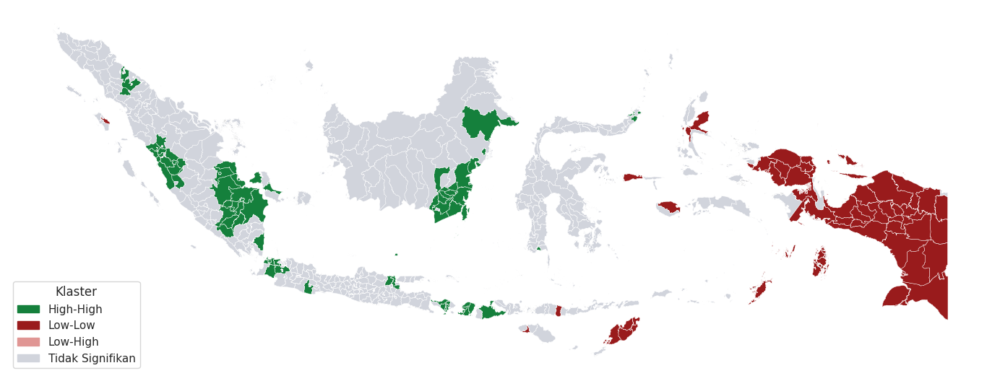

,cluster_label,Kabupaten/Kota
0,High-High,"Deli Serdang, Simalungun, Samosir, Pesisir Sel..."
1,Low-High,Kota Mojokerto
2,Low-Low,"Nias, Kupang, Timor Tengah Selatan, Timor Teng..."
3,Tidak Signifikan,"Aceh Selatan, Aceh Tenggara, Aceh Timur, Aceh ..."


In [ ]:
moran_lokal = Moran_Local(y_ikp, w_moran)
signifikan = moran_lokal.p_sim < 0.05
kuadran = moran_lokal.q  # 1=HH, 2=LH, 3=LL, 4=HL

final_data['cluster_label'] = 'Tidak Signifikan'
final_data.loc[signifikan & (kuadran == 1), 'cluster_label'] = 'High-High'
final_data.loc[signifikan & (kuadran == 3), 'cluster_label'] = 'Low-Low'
final_data.loc[signifikan & (kuadran == 4), 'cluster_label'] = 'High-Low'
final_data.loc[signifikan & (kuadran == 2), 'cluster_label'] = 'Low-High'

final_data['local_moran_I'] = moran_lokal.Is
final_data['p_value_lisa'] = moran_lokal.p_sim
final_data['z_score_lisa'] = moran_lokal.z_sim

WARNA_CLUSTER = {
    'High-High': '#15803c', 'Low-Low': '#991b1c', 'High-Low': '#b9f8d1',
    'Low-High': '#e09694', 'Tidak Signifikan': '#d1d4dc',
}

fig, ax = plt.subplots(figsize=(14, 8))
for label, subset in final_data.groupby('cluster_label'):
    subset.plot(ax=ax, color=WARNA_CLUSTER[label], edgecolor='white', linewidth=0.3)
legend_items = [mpatches.Patch(color=WARNA_CLUSTER[k], label=k)
                for k in WARNA_CLUSTER if k in final_data['cluster_label'].unique()]
ax.legend(handles=legend_items, loc='lower left', title="Klaster")
ax.set_axis_off()
plt.tight_layout()
plt.savefig('peta_lisa.png', dpi=300)
plt.show()

grouped_clusters = (
    final_data[final_data['cluster_label'] != 'No Significant']
    .groupby('cluster_label')['Kabupaten/Kota']
    .apply(lambda x: ', '.join(x))
    .reset_index()
)
# grouped_clusters.to_excel('cluster_lisa.xlsx', index=False)
grouped_clusters


In [ ]:
# Simpan hasil Local Moran's I dari final_data
cols = [
    "Kode Wilayah", "Provinsi", "Kabupaten/Kota", "IKP", "KATEGORI",
    "local_moran_I", "p_value_lisa", "z_score_lisa", "cluster_label", "geometry"
]

# Pastikan final_data tersedia
if 'final_data' not in globals():
    raise NameError("final_data tidak ditemukan di lingkungan saat ini.")

# Ambil kolom yang ada saja (jaga kompatibilitas jika beberapa kolom tidak ada)
cols_present = [c for c in cols if c in final_data.columns]

final_lisa = final_data[cols_present].copy()

# Simpan GeoPackage (jika geometry ada) dan CSV tanpa geometry
if "geometry" in final_lisa.columns:
    final_lisa.to_file("local_moran_results.gpkg", driver="GPKG")
    final_lisa.drop(columns="geometry").to_csv("local_moran_results.csv", index=False)
else:
    final_lisa.to_csv("local_moran_results.csv", index=False)

# Jika grouped_clusters ada, simpan juga ringkasan klaster
if 'grouped_clusters' in globals():
    try:
        grouped_clusters.to_csv("lisa_grouped_clusters.csv", index=False)
    except Exception:
        grouped_clusters.to_csv("lisa_grouped_clusters.csv", index=True)

print("Tersimpan: local_moran_results.csv" + (", local_moran_results.gpkg" if "geometry" in final_lisa.columns else "") + (", lisa_grouped_clusters.csv" if 'grouped_clusters' in globals() else ""))

Tersimpan: local_moran_results.csv, local_moran_results.gpkg, lisa_grouped_clusters.csv


In [ ]:
final_data.head()

,Kode Wilayah,Provinsi,Kabupaten/Kota,NCPR,ENERGI,PROHE,CBPK,MISKIN,CVHARGA,POU,...,WADMKK,WADMPR,area_km2,centroid,geometry,KATEGORI,cluster_label,local_moran_I,p_value_lisa,z_score_lisa
0,1101,Aceh,Aceh Selatan,0.91,94.4,73.7,100.0,12.1,7.4,13.7,...,Aceh Selatan,Aceh,4216.313435,POINT (10846576.598 352172.636),"MULTIPOLYGON Z (((10827877.219 406471.109 0, 1...",Sangat Tahan,Tidak Signifikan,-0.106547,0.136,-1.122436
1,1102,Aceh,Aceh Tenggara,0.55,103.1,92.2,0.0,12.5,8.9,13.0,...,Aceh Tenggara,Aceh,4221.726948,POINT (10875645.555 375251.305),"POLYGON Z ((10912566.741 370986.869 0, 1091255...",Tahan,Tidak Signifikan,-0.055759,0.357,-0.448330
2,1103,Aceh,Aceh Timur,0.77,95.3,92.1,0.0,13.4,7.3,8.6,...,Aceh Timur,Aceh,5481.200810,POINT (10867689.34 516031.846),"MULTIPOLYGON Z (((10911272.721 511304.57 0, 10...",Sangat Tahan,Tidak Signifikan,-0.000029,0.450,-0.020117
3,1104,Aceh,Aceh Tengah,2.87,98.2,81.6,0.0,14.4,5.7,8.6,...,Aceh Tengah,Aceh,4526.312170,POINT (10784772.408 503681.892),"POLYGON Z ((10755817.953 552000.017 0, 1075595...",Tahan,Tidak Signifikan,-0.000495,0.461,-0.029569
4,1105,Aceh,Aceh Barat,0.71,97.7,101.5,12.0,17.9,9.5,6.2,...,Aceh Barat,Aceh,2818.422165,POINT (10706807.23 496374.504),"POLYGON Z ((10715645.378 525171.811 0, 1071530...",Sangat Tahan,Tidak Signifikan,0.018358,0.350,0.509569


# 9. Regresi Logistik Ordinal Multilevel Spasial Bayesian

Struktur model bertahap (Null → Multilevel → CAR) dipertahankan agar kontribusi
tiap komponen (efek acak provinsi, lalu efek spasial CAR) dapat dibandingkan lewat LOO/WAIC,
sesuai RM3 pada skripsi.


### 9.1 Persiapan Data Model

In [ ]:
df_model = final_data.copy()

# Standardisasi prediktor level kabupaten/kota (level 1)
scaler_X = StandardScaler()
df_model[KOLOM_PREDIKTOR[:-1]] = scaler_X.fit_transform(df_model[KOLOM_PREDIKTOR[:-1]])  # semua kecuali BANSOS

# BANSOS adalah prediktor level provinsi (level 2) -> ambil nilai unik per provinsi, transformasi log1p
prov_df = df_model[['Provinsi', 'BANSOS']].drop_duplicates().copy()
prov_df['BANSOS_scaled'] = np.log1p(prov_df['BANSOS'])
df_model = df_model.drop(columns=['BANSOS']).merge(prov_df[['Provinsi', 'BANSOS_scaled']], on='Provinsi', how='left')

X_cols = KOLOM_PREDIKTOR[:-1]  # 15 prediktor level kabupaten (BANSOS dikeluarkan, jadi Z tersendiri)
X = df_model[X_cols].values
Z = df_model["BANSOS_scaled"].values
y = df_model["KATEGORI"].cat.codes.values

province_idx, provinces = pd.factorize(df_model["Provinsi"])
kab_idx, kabupaten = pd.factorize(df_model["Kabupaten/Kota"])

n_prov = len(provinces)
n_kab = len(kabupaten)
n_obs = len(df_model)
n_features = X.shape[1]
n_cats = df_model["KATEGORI"].cat.categories.size

coords = {"prediktor": X_cols, "provinsi": provinces, "kabupaten": kabupaten}

# Cutpoints empiris (logit dari proporsi kumulatif kategori observasi) sebagai titik awal prior
def hitung_cutpoints_empiris(y_arr, n_kategori):
    proporsi = np.bincount(y_arr, minlength=n_kategori) / len(y_arr)
    proporsi_kumulatif = np.clip(np.cumsum(proporsi)[:-1], 1e-4, 1 - 1e-4)
    return np.log(proporsi_kumulatif / (1 - proporsi_kumulatif))

empirical_cutpoints = hitung_cutpoints_empiris(y, n_cats)
print("Cutpoints empiris:", np.round(empirical_cutpoints, 3))


NameError: name 'final_data' is not defined

### 9.2 Model Null (Baseline ICC)

In [ ]:
with pm.Model(coords=coords) as model_null:
    sigma_u = pm.HalfNormal("sigma_u", sigma=0.5)
    u_offset = pm.Normal("u_offset", mu=0, sigma=1.0, shape=n_prov, dims="provinsi")
    u = pm.Deterministic("u", u_offset * sigma_u, dims="provinsi")

    variance_u = pm.Deterministic("variance_u", sigma_u**2)
    varians_logistik = np.pi**2 / 3
    icc_null = pm.Deterministic("ICC_null", variance_u / (variance_u + varians_logistik))

    eta = u[province_idx]

    cutpoints = pm.Normal(
        "cutpoints", mu=empirical_cutpoints, sigma=1.5,
        shape=n_cats - 1, transform=pm.distributions.transforms.ordered,
    )
    y_obs = pm.OrderedLogistic("y_obs", eta=eta, cutpoints=cutpoints, observed=y)

    trace_null = pm.sample(
        draws=6000, tune=4000, chains=4, target_accept=0.95,
        init="adapt_diag", return_inferencedata=True,
        idata_kwargs={"log_likelihood": True},
    )

az.summary(trace_null, var_names=['sigma_u', 'cutpoints', 'ICC_null']).round(2)


Output()

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_871/745689653.py", line 18, in <cell line: 0>
    trace_null = pm.sample(
                 ^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pymc/sampling/mcmc.py", line 995, in sample
    return _sample_return(
           ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pymc/sampling/mcmc.py", line 1123, in _sample_return
    traces, length = _choose_chains(traces, tune)
                     ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/pymc/backends/base.py", line 633, in _choose_chains
    raise ValueError("Not enough samples to build a trace.")
ValueError: Not enough samples to build a trace.

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local

TypeError: object of type 'NoneType' has no len()

In [ ]:
az.summary(trace_null, var_names=['ICC_null', 'sigma_u'], hdi_prob=0.95, round_to=3)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ICC_null,0.611,0.049,0.515,0.705,0.000,0.000,10690.648,14283.365,1.0
sigma_u,2.290,0.236,1.829,2.752,0.002,0.002,10690.648,14283.365,1.0


In [ ]:
su = 2.3

iccc = su**2 / (su**2 + (np.pi**2 / 3))
iccc

0.6165595924748689

### 9.1.1 Model Regresi Logistik Ordinal
Regresi logistik ordinal biasa (hanya efek tetap)


In [ ]:
with pm.Model(coords=coords) as model_biasa:
    X_data = pm.Data("X_data", X)
    Z_data = pm.Data("Z_data", Z)
    prov_idx_data = pm.Data("prov_idx_data", province_idx)

    beta = pm.Normal("beta", mu=0, sigma=0.22, shape=n_features, dims="prediktor")
    gamma = pm.Normal("gamma", mu=0, sigma=0.28)

    sigma_u = pm.HalfNormal("sigma_u", sigma=0.28)
    u_offset = pm.Normal("u_offset", mu=0, sigma=1.0, shape=n_prov, dims="provinsi")
    u = pm.Deterministic("u", u_offset * sigma_u, dims="provinsi")
    variance_u = pm.Deterministic("variance_u", sigma_u**2)

    eta = pm.Deterministic("eta", pm.math.dot(X_data, beta))

    cutpoints = pm.Normal(
        "cutpoints", mu=empirical_cutpoints, sigma=1.0,
        shape=n_cats - 1, transform=pm.distributions.transforms.ordered,
    )
    y_obs = pm.OrderedLogistic("y_obs", eta=eta, cutpoints=cutpoints, observed=y)

    trace_biasa = pm.sample(
        draws=2000, tune=1000, chains=4, cores=4, target_accept=0.95,
        init="adapt_diag", return_inferencedata=True,
        idata_kwargs={"log_likelihood": True},
    )

az.summary(trace_biasa, var_names=['beta']).round(2)


Output()

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[NCPR],-0.84,0.13,-1.10,-0.59,0.0,0.0,12980.0,6214.0,1.0
beta[ENERGI],0.45,0.14,0.20,0.72,0.0,0.0,11564.0,6824.0,1.0
beta[PROHE],0.48,0.14,0.21,0.74,0.0,0.0,13949.0,6078.0,1.0
beta[CBPK],0.82,0.13,0.58,1.07,0.0,0.0,14392.0,5652.0,1.0
beta[MISKIN],-0.70,0.15,-0.96,-0.41,0.0,0.0,15491.0,6363.0,1.0
beta[CVHARGA],-0.31,0.11,-0.52,-0.09,0.0,0.0,14874.0,5206.0,1.0
beta[POU],-0.44,0.16,-0.74,-0.14,0.0,0.0,16324.0,6233.0,1.0
beta[RLSP],-0.02,0.15,-0.28,0.27,0.0,0.0,14296.0,6032.0,1.0
beta[TNPAIR],-0.45,0.13,-0.69,-0.19,0.0,0.0,14972.0,6499.0,1.0
beta[TNPLISTRIK],-0.24,0.18,-0.56,0.11,0.0,0.0,14447.0,5690.0,1.0


### 9.3 Model Multilevel (Fixed Effects + Random Intercept Provinsi)
Prior fixed effect memakai Normal dengan sd hasil *prior predictive check*, bukan sd=1 arbitrer
seperti pada iterasi awal di kode asli.


In [ ]:
with pm.Model(coords=coords) as model_multilevel:
    X_data = pm.Data("X_data", X)
    Z_data = pm.Data("Z_data", Z)
    prov_idx_data = pm.Data("prov_idx_data", province_idx)

    beta = pm.Normal("beta", mu=0, sigma=0.22, shape=n_features, dims="prediktor")
    gamma = pm.Normal("gamma", mu=0, sigma=0.28)

    sigma_u = pm.HalfNormal("sigma_u", sigma=0.28)
    u_offset = pm.Normal("u_offset", mu=0, sigma=1.0, shape=n_prov, dims="provinsi")
    u = pm.Deterministic("u", u_offset * sigma_u, dims="provinsi")
    variance_u = pm.Deterministic("variance_u", sigma_u**2)

    eta = pm.Deterministic("eta", pm.math.dot(X_data, beta) + gamma * Z_data + u[prov_idx_data])

    cutpoints = pm.Normal(
        "cutpoints", mu=empirical_cutpoints, sigma=1.0,
        shape=n_cats - 1, transform=pm.distributions.transforms.ordered,
    )
    y_obs = pm.OrderedLogistic("y_obs", eta=eta, cutpoints=cutpoints, observed=y)

    trace_multilevel = pm.sample(
        draws=2000, tune=1000, chains=4, cores=4, target_accept=0.95,
        init="adapt_diag", return_inferencedata=True,
        idata_kwargs={"log_likelihood": True},
    )

az.summary(trace_multilevel, var_names=['beta', 'gamma', 'sigma_u', 'cutpoints']).round(2)


Output()

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[NCPR],-0.85,0.14,-1.11,-0.59,0.00,0.00,6723.0,5633.0,1.0
beta[ENERGI],0.47,0.14,0.21,0.74,0.00,0.00,8371.0,6209.0,1.0
beta[PROHE],0.52,0.14,0.25,0.79,0.00,0.00,7313.0,5691.0,1.0
beta[CBPK],0.85,0.14,0.60,1.12,0.00,0.00,8929.0,5990.0,1.0
beta[MISKIN],-0.72,0.15,-1.02,-0.45,0.00,0.00,8412.0,6077.0,1.0
beta[CVHARGA],-0.33,0.12,-0.55,-0.12,0.00,0.00,9770.0,5942.0,1.0
beta[POU],-0.44,0.16,-0.75,-0.14,0.00,0.00,7879.0,5843.0,1.0
beta[RLSP],-0.01,0.15,-0.28,0.28,0.00,0.00,7865.0,6391.0,1.0
beta[TNPAIR],-0.46,0.14,-0.71,-0.20,0.00,0.00,8492.0,5793.0,1.0
beta[TNPLISTRIK],-0.24,0.18,-0.59,0.08,0.00,0.00,8705.0,6052.0,1.0


### 9.4 Model CAR Spasial (Model Final)
Menambahkan efek acak spasial `phi` dengan struktur *Conditional Autoregressive* (CAR),
direparameterisasi *non-centered* (`tau` difiksasi 1, magnitudo dikontrol lewat `sigma_phi`)
untuk menghindari *funnel geometry* yang menyebabkan divergence pada parameterisasi *centered*.


In [ ]:
with pm.Model(coords=coords) as model_car1:
    X_data = pm.Data("X_data", X)
    Z_data = pm.Data("Z_data", Z)
    prov_idx_data = pm.Data("prov_idx_data", province_idx)
    kab_idx_data = pm.Data("kab_idx_data", kab_idx)

    # --- Efek tetap ---
    beta = pm.Normal("beta", mu=0, sigma=0.22, shape=n_features, dims="prediktor")
    gamma = pm.Normal("gamma", mu=0, sigma=0.28)

    # --- Efek acak multilevel provinsi (non-centered) ---
    sigma_u = pm.HalfNormal("sigma_u", sigma=0.28)
    u_offset = pm.Normal("u_offset", mu=0, sigma=1.0, shape=n_prov, dims="provinsi")
    u = pm.Deterministic("u", u_offset * sigma_u, dims="provinsi")
    variance_u = pm.Deterministic("variance_u", sigma_u**2)

    # --- Efek acak spasial CAR (non-centered, tau difiksasi = 1) ---
    a_spatial = pm.Beta("a_spatial", alpha=8, beta=2)
    phi_raw = pm.CAR("phi_raw", mu=np.zeros(n_kab), alpha=a_spatial, W=W_sym, tau=1.0, dims="kabupaten")
    sigma_phi = pm.HalfNormal("sigma_phi", sigma=0.80)
    phi = pm.Deterministic("phi", phi_raw * sigma_phi, dims="kabupaten")
    variance_phi = pm.Deterministic("variance_phi", sigma_phi**2)

    # --- Prediktor linear ---
    eta = pm.Deterministic(
        "eta",
        pm.math.dot(X_data, beta) + gamma * Z_data + u[prov_idx_data] + phi[kab_idx_data],
    )

    # --- Cutpoints ---
    cutpoints = pm.Normal(
        "cutpoints", mu=empirical_cutpoints, sigma=1.0,
        shape=n_cats - 1, transform=pm.distributions.transforms.ordered,
    )

    # --- Likelihood ---
    y_obs = pm.OrderedLogistic("y_obs", eta=eta, cutpoints=cutpoints, observed=y)

    # --- Sampling MCMC ---
    trace_car1 = pm.sample(
        draws=6000, tune=4000, chains=4, target_accept=0.95,
        init="adapt_diag", return_inferencedata=True,
        idata_kwargs={"log_likelihood": True},
    )


Output()

In [ ]:
with pm.Model(coords=coords) as model_car:
    X_data = pm.Data("X_data", X)
    Z_data = pm.Data("Z_data", Z)
    prov_idx_data = pm.Data("prov_idx_data", province_idx)
    kab_idx_data = pm.Data("kab_idx_data", kab_idx)

    # --- Efek tetap ---
    beta = pm.Normal("beta", mu=0, sigma=10.0, shape=n_features, dims="prediktor")
    gamma = pm.Normal("gamma", mu=0, sigma=10.0)

    # --- Efek acak multilevel provinsi (non-centered) ---
    sigma_u = pm.HalfNormal("sigma_u", sigma=10.0)
    u_offset = pm.Normal("u_offset", mu=0, sigma=10.0, shape=n_prov, dims="provinsi")
    u = pm.Deterministic("u", u_offset * sigma_u, dims="provinsi")
    variance_u = pm.Deterministic("variance_u", sigma_u**2)

    # --- Efek acak spasial CAR (non-centered, tau difiksasi = 1) ---
    a_spatial = pm.Beta("a_spatial", alpha=8, beta=2)
    phi_raw = pm.CAR("phi_raw", mu=np.zeros(n_kab), alpha=a_spatial, W=W_sym, tau=1.0, dims="kabupaten")
    sigma_phi = pm.HalfNormal("sigma_phi", sigma=10.0)
    phi = pm.Deterministic("phi", phi_raw * sigma_phi, dims="kabupaten")
    variance_phi = pm.Deterministic("variance_phi", sigma_phi**2)

    # --- Prediktor linear ---
    eta = pm.Deterministic(
        "eta",
        pm.math.dot(X_data, beta) + gamma * Z_data + u[prov_idx_data] + phi[kab_idx_data],
    )

    # --- Cutpoints ---
    cutpoints = pm.Normal(
        "cutpoints", mu=empirical_cutpoints, sigma=10.0,
        shape=n_cats - 1, transform=pm.distributions.transforms.ordered,
    )

    # --- Likelihood ---
    y_obs = pm.OrderedLogistic("y_obs", eta=eta, cutpoints=cutpoints, observed=y)

    # --- Sampling MCMC ---
    trace_car = pm.sample(
        draws=6000, tune=4000, chains=4, target_accept=0.95,
        init="adapt_diag", return_inferencedata=True,
        idata_kwargs={"log_likelihood": True},
    )


Output()

In [ ]:
# # Model 1: Prior yang lebih longgar (kurang informatif) untuk efek tetap dan efek acak
# beta = pm.Normal("beta", mu=0, sigma=10.0, shape=n_features, dims="prediktor")
# gamma = pm.Normal("gamma", mu=0, sigma=10.0)

# # --- Efek acak multilevel provinsi (non-centered) ---
# sigma_u = pm.HalfNormal("sigma_u", sigma=10.0)
# u_offset = pm.Normal("u_offset", mu=0, sigma=10.0, shape=n_prov, dims="provinsi")
# u = pm.Deterministic("u", u_offset * sigma_u, dims="provinsi")
# variance_u = pm.Deterministic("variance_u", sigma_u**2)

# # --- Efek acak spasial CAR (non-centered, tau difiksasi = 1) ---
# a_spatial = pm.Beta("a_spatial", alpha=8, beta=2)
# phi_raw = pm.CAR("phi_raw", mu=np.zeros(n_kab), alpha=a_spatial, W=W_sym, tau=1.0, dims="kabupaten")
# sigma_phi = pm.HalfNormal("sigma_phi", sigma=10.0)
# phi = pm.Deterministic("phi", phi_raw * sigma_phi, dims="kabupaten")
# variance_phi = pm.Deterministic("variance_phi", sigma_phi**2)

# # Model 2: Prior yang lebih ketat (lebih informatif) untuk efek tetap dan efek acak
# beta = pm.Normal("beta", mu=0, sigma=0.22, shape=n_features, dims="prediktor")
# gamma = pm.Normal("gamma", mu=0, sigma=0.28)

# sigma_u = pm.HalfNormal("sigma_u", sigma=0.28)
# u_offset = pm.Normal("u_offset", mu=0, sigma=1.0, shape=n_prov, dims="provinsi")
# u = pm.Deterministic("u", u_offset * sigma_u, dims="provinsi")

# a_spatial = pm.Beta("a_spatial", alpha=8, beta=2)
# phi_raw = pm.CAR("phi_raw", mu=np.zeros(n_kab), alpha=a_spatial, W=W_sym, tau=1.0, dims="kabupaten")
# sigma_phi = pm.HalfNormal("sigma_phi", sigma=0.80)
# phi = pm.Deterministic("phi", phi_raw * sigma_phi, dims="kabupaten")


# Prior Pembanding

In [ ]:
prior_configs = {
    "baseline": {  # weakly-informative, hasil kalibrasi prior predictive check
        "sigma_beta": 0.22,
        "sigma_gamma": 0.28,
        "sigma_u": 0.28,
        "sigma_phi": 0.80,
        "sigma_cutpoints": 1.0,
    },
    "tight": {  # informatif kuat / regularisasi ketat
        "sigma_beta": 0.05,
        "sigma_gamma": 0.05,
        "sigma_u": 0.05,
        "sigma_phi": 0.20,
        "sigma_cutpoints": 0.5,
    },
    "wide": {  # kurang informatif
        "sigma_beta": 1.0,
        "sigma_gamma": 1.0,
        "sigma_u": 1.0,
        "sigma_phi": 1.0,
        "sigma_cutpoints": 2.5,
    },
    "vague": {  # mendekati non-informatif
        "sigma_beta": 10.0,
        "sigma_gamma": 10.0,
        "sigma_u": 10.0,
        "sigma_phi": 10.0,
        "sigma_cutpoints": 10.0,
    },
}

In [ ]:
def build_car_model(cfg, coords, X, Z, province_idx, kab_idx, W_sym,
                     empirical_cutpoints, n_features, n_prov, n_kab, n_cats, y):
    with pm.Model(coords=coords) as model:
        X_data = pm.Data("X_data", X)
        Z_data = pm.Data("Z_data", Z)
        prov_idx_data = pm.Data("prov_idx_data", province_idx)
        kab_idx_data = pm.Data("kab_idx_data", kab_idx)

        # --- Efek tetap ---
        beta = pm.Normal("beta", mu=0, sigma=cfg["sigma_beta"], shape=n_features, dims="prediktor")
        gamma = pm.Normal("gamma", mu=0, sigma=cfg["sigma_gamma"])

        # --- Efek acak multilevel provinsi (non-centered) ---
        sigma_u = pm.HalfNormal("sigma_u", sigma=cfg["sigma_u"])
        u_offset = pm.Normal("u_offset", mu=0, sigma=1.0, shape=n_prov, dims="provinsi")
        u = pm.Deterministic("u", u_offset * sigma_u, dims="provinsi")
        variance_u = pm.Deterministic("variance_u", sigma_u**2)

        # --- Efek acak spasial CAR (non-centered, tau difiksasi = 1) ---
        a_spatial = pm.Beta("a_spatial", alpha=8, beta=2)
        phi_raw = pm.CAR("phi_raw", mu=np.zeros(n_kab), alpha=a_spatial, W=W_sym, tau=1.0, dims="kabupaten")
        sigma_phi = pm.HalfNormal("sigma_phi", sigma=cfg["sigma_phi"])
        phi = pm.Deterministic("phi", phi_raw * sigma_phi, dims="kabupaten")
        variance_phi = pm.Deterministic("variance_phi", sigma_phi**2)

        # --- Prediktor linear ---
        eta = pm.Deterministic(
            "eta",
            pm.math.dot(X_data, beta) + gamma * Z_data + u[prov_idx_data] + phi[kab_idx_data],
        )

        # --- Cutpoints ---
        cutpoints = pm.Normal(
            "cutpoints", mu=empirical_cutpoints, sigma=cfg["sigma_cutpoints"],
            shape=n_cats - 1, transform=pm.distributions.transforms.ordered,
        )

        # --- Likelihood ---
        y_obs = pm.OrderedLogistic("y_obs", eta=eta, cutpoints=cutpoints, observed=y)

    return model

In [ ]:
traces = {}

for name, cfg in prior_configs.items():
    print(f"=== Sampling model dengan prior: {name} ===")
    model = build_car_model(
        cfg, coords, X, Z, province_idx, kab_idx, W_sym,
        empirical_cutpoints, n_features, n_prov, n_kab, n_cats, y,
    )
    with model:
        trace = pm.sample(
            draws=2000, tune=1000, chains=4, target_accept=0.95,
            init="adapt_diag", return_inferencedata=True,
            idata_kwargs={"log_likelihood": True},
        )
    traces[name] = trace

NameError: name 'prior_configs' is not defined

In [ ]:
comparison = az.compare(traces, ic="loo")
comparison

/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimat

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
vague,0,-23.615934,11.563928,0.000000,1.000000e+00,3.903515,0.000000,True,log
wide,1,-52.828098,8.457317,29.212164,0.000000e+00,4.566393,2.947329,True,log
baseline,2,-114.670021,6.200608,91.054086,0.000000e+00,5.910802,5.232706,False,log
tight,3,-228.019212,26.248001,204.403278,1.599744e-09,10.035465,9.694770,True,log


In [ ]:
for name, trace in traces.items():
    loo_res = az.loo(trace, pointwise=True)
    n_bad = np.sum(loo_res.pareto_k > 0.7)
    print(f"{name}: {n_bad} observasi dengan k-hat > 0.7 dari total {len(loo_res.pareto_k)}")
    print(loo_res)  # tampilkan breakdown kategori good/ok/bad/very bad
    print()

baseline: <xarray.DataArray 'pareto_shape' ()> Size: 8B
array(0) observasi dengan k-hat > 0.7 dari total 514
Computed from 8000 posterior samples and 514 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  -114.67     5.91
p_loo        6.20        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      514  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%




/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


tight: <xarray.DataArray 'pareto_shape' ()> Size: 8B
array(5) observasi dengan k-hat > 0.7 dari total 514
Computed from 8000 posterior samples and 514 observations log-likelihood matrix.

         Estimate       SE
elpd_loo  -228.02    10.04
p_loo       26.25        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      509   99.0%
   (0.70, 1]   (bad)         4    0.8%
   (1, Inf)   (very bad)    1    0.2%




/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


wide: <xarray.DataArray 'pareto_shape' ()> Size: 8B
array(11) observasi dengan k-hat > 0.7 dari total 514
Computed from 8000 posterior samples and 514 observations log-likelihood matrix.

         Estimate       SE
elpd_loo   -52.83     4.57
p_loo        8.46        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      503   97.9%
   (0.70, 1]   (bad)         8    1.6%
   (1, Inf)   (very bad)    3    0.6%




/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


vague: <xarray.DataArray 'pareto_shape' ()> Size: 8B
array(378) observasi dengan k-hat > 0.7 dari total 514
Computed from 8000 posterior samples and 514 observations log-likelihood matrix.

         Estimate       SE
elpd_loo   -23.62     3.90
p_loo       11.56        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      136   26.5%
   (0.70, 1]   (bad)       141   27.4%
   (1, Inf)   (very bad)  237   46.1%




In [ ]:
import xarray as xr

def compute_information_criteria(idata, model_name="model"):
    """
    Menghitung AIC, BIC, dan DIC dari sebuah InferenceData PyMC
    yang sudah menyertakan grup log_likelihood dan observed_data.
    """
    # --- Ambil data observasi (y) ---
    y = idata.observed_data["y_obs"].values
    n_obs = len(y)

    # --- Ambil log-likelihood per sampel posterior, flatten chain & draw ---
    log_lik = idata.log_likelihood["y_obs"]
    obs_dim = [d for d in log_lik.dims if d not in ("chain", "draw")][0]
    log_lik_per_draw = log_lik.sum(dim=obs_dim).stack(sample=("chain", "draw")).values
    D_samples = -2.0 * log_lik_per_draw          # deviance tiap sampel posterior
    D_bar = D_samples.mean()                      # posterior mean deviance

    # --- Plug-in deviance: evaluasi log-lik pada rata-rata posterior parameter ---
    eta_bar = idata.posterior["eta"].mean(dim=("chain", "draw")).values
    cutpoints_bar = idata.posterior["cutpoints"].mean(dim=("chain", "draw")).values

    loglik_expr = pm.logp(
        pm.OrderedLogistic.dist(eta=eta_bar, cutpoints=cutpoints_bar), y
    )
    loglik_at_mean = loglik_expr.eval().sum()
    D_hat = -2.0 * loglik_at_mean

    # --- DIC (Spiegelhalter et al., 2002) ---
    p_D = D_bar - D_hat                # jumlah parameter efektif versi DIC
    DIC = D_bar + p_D                  # = 2*D_bar - D_hat

    # --- Versi robust p_D (Gelman et al., 2004), dipakai jika p_D negatif/tidak stabil ---
    p_D_robust = 0.5 * np.var(D_samples)
    DIC_robust = D_bar + p_D_robust

    # --- Jumlah parameter nominal (bukan efektif) untuk AIC/BIC ---
    dims = idata.posterior.dims
    n_features   = dims.get("prediktor", 0)
    n_prov       = dims.get("provinsi", 0)
    n_kab        = dims.get("kabupaten", 0)
    n_cutpoints  = idata.posterior["cutpoints"].shape[-1]

    k_nominal = (
        n_features      # beta
        + 1             # gamma
        + 1             # sigma_u
        + n_prov        # u_offset
        + 1             # a_spatial
        + n_kab         # phi_raw
        + 1             # sigma_phi
        + n_cutpoints   # cutpoints
    )

    # --- AIC & BIC, memakai plug-in log-lik pada rata-rata posterior sbg proksi ---
    AIC = -2.0 * loglik_at_mean + 2.0 * k_nominal
    BIC = -2.0 * loglik_at_mean + k_nominal * np.log(n_obs)

    return {
        "model": model_name,
        "n_obs": n_obs,
        "k_nominal": k_nominal,
        "loglik_at_mean": loglik_at_mean,
        "D_bar": D_bar,
        "D_hat": D_hat,
        "p_D": p_D,
        "DIC": DIC,
        "p_D_robust": p_D_robust,
        "DIC_robust": DIC_robust,
        "AIC": AIC,
        "BIC": BIC,
    }

In [ ]:
compute_information_criteria(trace_car, model_name="CAR Model"), compute_information_criteria(trace_multilevel, model_name="Multilevel Model")

/tmp/ipykernel_40353/1161641209.py:39: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  n_features   = dims.get("prediktor", 0)
<frozen _collections_abc>:807: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
/tmp/ipykernel_40353/1161641209.py:40: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  n_prov       = dims.get("provinsi", 0)
/tmp/ipykernel_40353/1161641209.py:41: FutureWarning: The return type 

({'model': 'CAR Model',
  'n_obs': 514,
  'k_nominal': 573,
  'loglik_at_mean': np.float64(-104.47782515815601),
  'D_bar': np.float64(222.61794807757343),
  'D_hat': np.float64(208.95565031631202),
  'p_D': np.float64(13.662297761261414),
  'DIC': np.float64(236.28024583883484),
  'p_D_robust': np.float64(74.6092125370045),
  'DIC_robust': np.float64(297.22716061457794),
  'AIC': np.float64(1354.9556503163121),
  'BIC': np.float64(3785.749581422122)},
 {'model': 'Multilevel Model',
  'n_obs': 514,
  'k_nominal': 59,
  'loglik_at_mean': np.float64(-105.46696518677979),
  'D_bar': np.float64(222.9519802954788),
  'D_hat': np.float64(210.93393037355958),
  'p_D': np.float64(12.018049921919214),
  'DIC': np.float64(234.970030217398),
  'p_D_robust': np.float64(73.6615806241355),
  'DIC_robust': np.float64(296.6135609196143),
  'AIC': np.float64(328.9339303735596),
  'BIC': np.float64(579.2251030354143)})

In [ ]:
results = []
for name, trace in traces.items():
    res = compute_information_criteria(trace, model_name=name)
    results.append(res)

df_ic = pd.DataFrame(results).set_index("model")
df_ic[["D_bar", "D_hat", "p_D", "DIC", "p_D_robust", "DIC_robust", "AIC", "BIC", "k_nominal"]].round(2)

/tmp/ipykernel_1373/1161641209.py:39: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  n_features   = dims.get("prediktor", 0)
<frozen _collections_abc>:807: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
/tmp/ipykernel_1373/1161641209.py:40: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  n_prov       = dims.get("provinsi", 0)
/tmp/ipykernel_1373/1161641209.py:41: FutureWarning: The return type of 

,D_bar,D_hat,p_D,DIC,p_D_robust,DIC_robust,AIC,BIC,k_nominal
model,,,,,,,,,
baseline,222.79,209.15,13.64,236.43,76.10,298.89,1355.15,3785.94,573
tight,422.71,388.28,34.43,457.15,115.71,538.42,1534.28,3965.08,573
wide,95.78,78.13,17.65,113.43,42.40,138.18,1224.13,3654.93,573
vague,30.49,12.99,17.50,47.99,22.07,52.56,1158.99,3589.79,573


In [ ]:
compare_table = df_ic[["p_D", "p_D_robust", "AIC", "BIC", "DIC", "DIC_robust"]].copy()
compare_table["p_loo"] = [az.loo(traces[m], pointwise=False).p_loo for m in df_ic.index]
compare_table.round(2)

/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimat

,p_D,p_D_robust,AIC,BIC,DIC,DIC_robust,p_loo
model,,,,,,,
baseline,13.64,76.10,1355.15,3785.94,236.43,298.89,6.20
tight,34.43,115.71,1534.28,3965.08,457.15,538.42,26.25
wide,17.65,42.40,1224.13,3654.93,113.43,138.18,8.46
vague,17.50,22.07,1158.99,3589.79,47.99,52.56,11.56


# 10. Diagnostik Konvergensi Model CAR

In [ ]:
def cek_diagnostik(trace, var_names, nama_model="Model"):
    """Cek r_hat, divergence, dan ESS dalam satu fungsi (menggantikan pengecekan manual berulang)."""
    ringkasan = az.summary(trace, var_names=var_names)
    print(f"=== Diagnostik {nama_model} ===")

    r_hat_bermasalah = ringkasan[ringkasan["r_hat"] > 1.01]
    if len(r_hat_bermasalah) > 0:
        print("PERINGATAN: parameter dengan r_hat > 1.01 (belum konvergen):")
        print(r_hat_bermasalah)
    else:
        print("Semua r_hat <= 1.01 (konvergensi baik).")

    n_divergensi = int(trace.sample_stats["diverging"].sum())
    total_sampel = trace.posterior.dims["chain"] * trace.posterior.dims["draw"]
    print(f"Divergent transitions: {n_divergensi} ({100 * n_divergensi / total_sampel:.2f}% dari total sampel)")

    ess_rendah = ringkasan[ringkasan["ess_bulk"] < 400]
    if len(ess_rendah) > 0:
        print("PERINGATAN: parameter dengan ESS bulk < 400 (mixing lambat):")
        print(ess_rendah)

    return ringkasan


ringkasan_car = cek_diagnostik(
    trace_car1, ["beta", "gamma", "sigma_u", "a_spatial", "sigma_phi", "cutpoints"], "Model CAR"
)
display(ringkasan_car.round(3))


=== Diagnostik Model CAR ===
Semua r_hat <= 1.01 (konvergensi baik).
Divergent transitions: 0 (0.00% dari total sampel)


/tmp/ipykernel_2253/1727901588.py:14: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  total_sampel = trace.posterior.dims["chain"] * trace.posterior.dims["draw"]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[NCPR],-0.847,0.136,-1.107,-0.595,0.001,0.001,23624.0,18663.0,1.0
beta[ENERGI],0.475,0.144,0.195,0.738,0.001,0.001,22457.0,17939.0,1.0
beta[PROHE],0.517,0.142,0.255,0.786,0.001,0.001,24224.0,18739.0,1.0
beta[CBPK],0.856,0.135,0.601,1.110,0.001,0.001,26779.0,17594.0,1.0
beta[MISKIN],-0.721,0.153,-1.002,-0.429,0.001,0.001,22806.0,18081.0,1.0
beta[CVHARGA],-0.332,0.118,-0.553,-0.109,0.001,0.001,27353.0,17879.0,1.0
beta[POU],-0.443,0.159,-0.744,-0.146,0.001,0.001,22795.0,19193.0,1.0
beta[RLSP],-0.011,0.152,-0.292,0.277,0.001,0.001,21861.0,18155.0,1.0
beta[TNPAIR],-0.461,0.134,-0.714,-0.210,0.001,0.001,23687.0,17974.0,1.0
beta[TNPLISTRIK],-0.242,0.182,-0.592,0.094,0.001,0.001,24574.0,16320.0,1.0


In [ ]:
ringkasan_car.to_excel('diagnostik_model_car.xlsx', index=True)

In [ ]:
az.summary(trace_car1, var_names=['u']).head()

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
u[Aceh],0.019,0.174,-0.323,0.387,0.001,0.002,26483.0,21175.0,1.0
u[Sumatera Utara],-0.009,0.169,-0.357,0.336,0.001,0.002,24059.0,20023.0,1.0
u[Sumatera Barat],0.050,0.195,-0.302,0.466,0.001,0.002,23691.0,19694.0,1.0
u[Riau],-0.075,0.203,-0.510,0.278,0.001,0.002,21012.0,19784.0,1.0
u[Jambi],0.045,0.195,-0.309,0.459,0.001,0.002,25255.0,20997.0,1.0


In [ ]:
# Simpan seluruh ringkasan trace_car ke berbagai format untuk dokumentasi lengkap
ringkasan_lengkap = az.summary(trace_car1, hdi_prob=0.94, round_to=10)

# 1. Simpan ke Excel (format tabel yang mudah dibaca)
ringkasan_lengkap.to_excel('summary_trace_car_lengkap.xlsx')

# 2. Simpan ke CSV
ringkasan_lengkap.to_csv('summary_trace_car_lengkap.csv')

# 3. Tampilkan ringkasan lengkap
display(ringkasan_lengkap)

# 4. Buat versi ringkas hanya parameter utama (fixed effects + random effects variance)
param_utama = ['beta', 'gamma', 'sigma_u', 'a_spatial', 'sigma_phi', 'cutpoints']
ringkasan_utama = az.summary(trace_car1, var_names=param_utama, hdi_prob=0.94)
ringkasan_utama.to_excel('summary_parameter_utama.xlsx')
ringkasan_utama.to_csv('summary_parameter_utama.csv')

print("✓ Summary trace_car1 disimpan ke:")
print("  - summary_trace_car1_lengkap.xlsx (lengkap)")
print("  - summary_trace_car1_lengkap.csv (lengkap)")
print("  - summary_parameter_utama.xlsx (hanya parameter utama)")
print("  - summary_parameter_utama.csv (hanya parameter utama)")

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a_spatial,0.781717,0.121326,0.563115,0.981501,0.003554,0.001375,1012.387781,1578.344586,1.004390
beta[NCPR],-0.848548,0.136055,-1.101372,-0.589775,0.000917,0.000789,22008.461403,18654.549053,1.000214
beta[ENERGI],0.475958,0.143966,0.196880,0.739906,0.001014,0.000854,20145.313373,18181.237825,1.000018
beta[PROHE],0.518168,0.142184,0.249600,0.781540,0.000968,0.000871,21559.317366,18422.088331,1.000096
beta[CBPK],0.856303,0.136642,0.600490,1.116353,0.000800,0.000906,29191.887030,17593.772781,0.999985
...,...,...,...,...,...,...,...,...,...
"y_obs_probs[512, 1]",0.059795,0.037672,0.008982,0.128237,0.000247,0.000389,24710.733419,21427.813720,0.999930
"y_obs_probs[512, 2]",0.000169,0.000148,0.000011,0.000413,0.000001,0.000003,19880.693145,19580.940490,1.000001
"y_obs_probs[513, 0]",0.044604,0.026075,0.007326,0.091060,0.000162,0.000269,27085.968358,20915.322630,1.000031
"y_obs_probs[513, 1]",0.892744,0.030093,0.840058,0.942914,0.000226,0.000342,17931.450529,18546.801825,1.000051


✓ Summary trace_car1 disimpan ke:
  - summary_trace_car1_lengkap.xlsx (lengkap)
  - summary_trace_car1_lengkap.csv (lengkap)
  - summary_parameter_utama.xlsx (hanya parameter utama)
  - summary_parameter_utama.csv (hanya parameter utama)


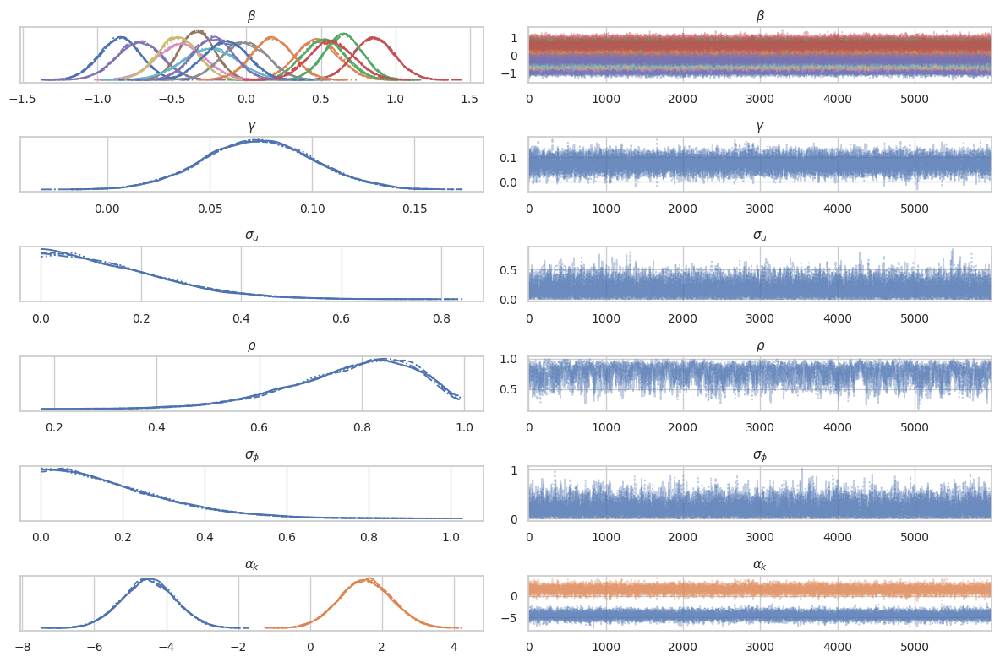

In [ ]:
class LabelMatematis(az.labels.BaseLabeller):
    _MAPPING = {
        "beta": r"$\beta$", "gamma": r"$\gamma$", "sigma_u": r"$\sigma_u$",
        "a_spatial": r"$\rho$", "sigma_phi": r"$\sigma_\phi$", "cutpoints": r"$\alpha_k$",
    }
    def make_label_vert(self, var_name, sel, isel):
        return self._MAPPING.get(var_name, var_name)


az.plot_trace(
    trace_car1, var_names=["beta", "gamma", "sigma_u", "a_spatial", "sigma_phi", "cutpoints"],
    compact=True, combined=False, labeller=LabelMatematis(), figsize=(12, 8),
)
plt.tight_layout()
plt.savefig('trace_plot_car.png', dpi=300)
plt.show()


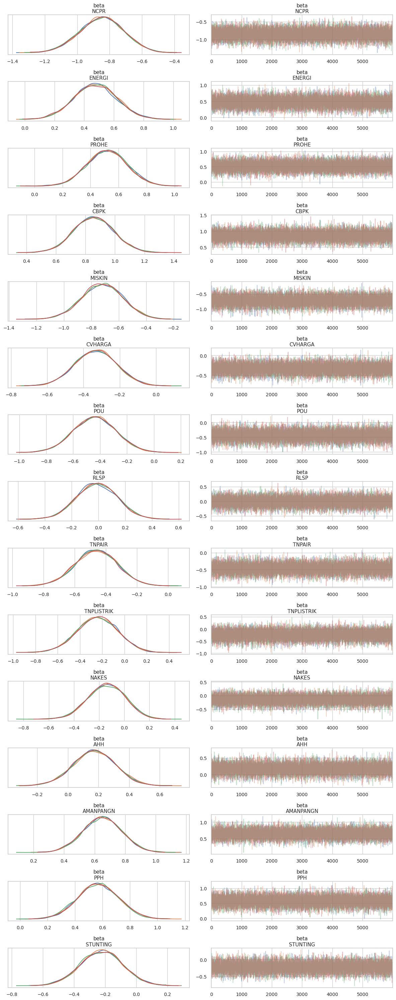

In [ ]:
az.plot_trace(
    trace_car1, var_names=["beta"],
    compact=False, combined=False
)

plt.tight_layout()
plt.savefig("trace_beta_per_variable.png", dpi=300)
plt.show()

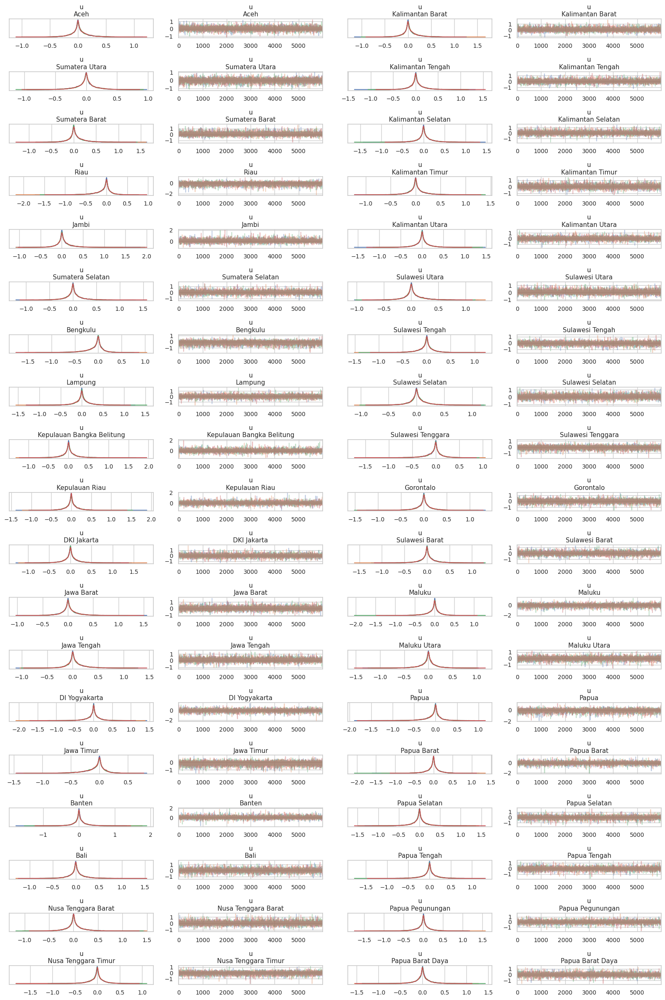

In [ ]:
# 1. Buat grid subplot secara manual (19 baris x 4 kolom)
# Sesuaikan figsize agar proporsional (misalnya lebar 16, tinggi 24)
fig, axes = plt.subplots(nrows=19, ncols=4, figsize=(16, 24))

# 2. Susun ulang array axes untuk diberikan ke ArviZ
# axes[:, :2] -> Mengambil 2 kolom pertama (kiri) untuk provinsi 1-19
# axes[:, 2:] -> Mengambil 2 kolom terakhir (kanan) untuk provinsi 20-38
# np.vstack akan menggabungkannya menjadi bentuk (38, 2) yang diharapkan ArviZ
axes_reshaped = np.vstack((axes[:, :2], axes[:, 2:]))

# 3. Plot trace menggunakan axes_reshaped
az.rcParams["plot.max_subplots"] = 38 * 2
az.plot_trace(
    trace_car1, 
    var_names=["u"],
    compact=False, 
    combined=False,
    axes=axes_reshaped  # Gunakan custom axes
)

# 4. Rapikan layout, simpan, dan tampilkan
plt.tight_layout()
plt.savefig("trace_u_per_variable_2columns.png", dpi=300)
plt.show()

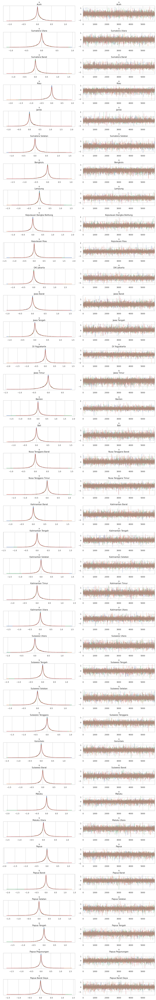

In [ ]:
az.rcParams["plot.max_subplots"] = 38*2
az.plot_trace(
    trace_car1, var_names=["u"],
    compact=False, combined=False,
)

plt.tight_layout()
plt.savefig("trace_u_per_variable.png", dpi=300)
plt.show()

IndexError: index 15 is out of bounds for axis 0 with size 15

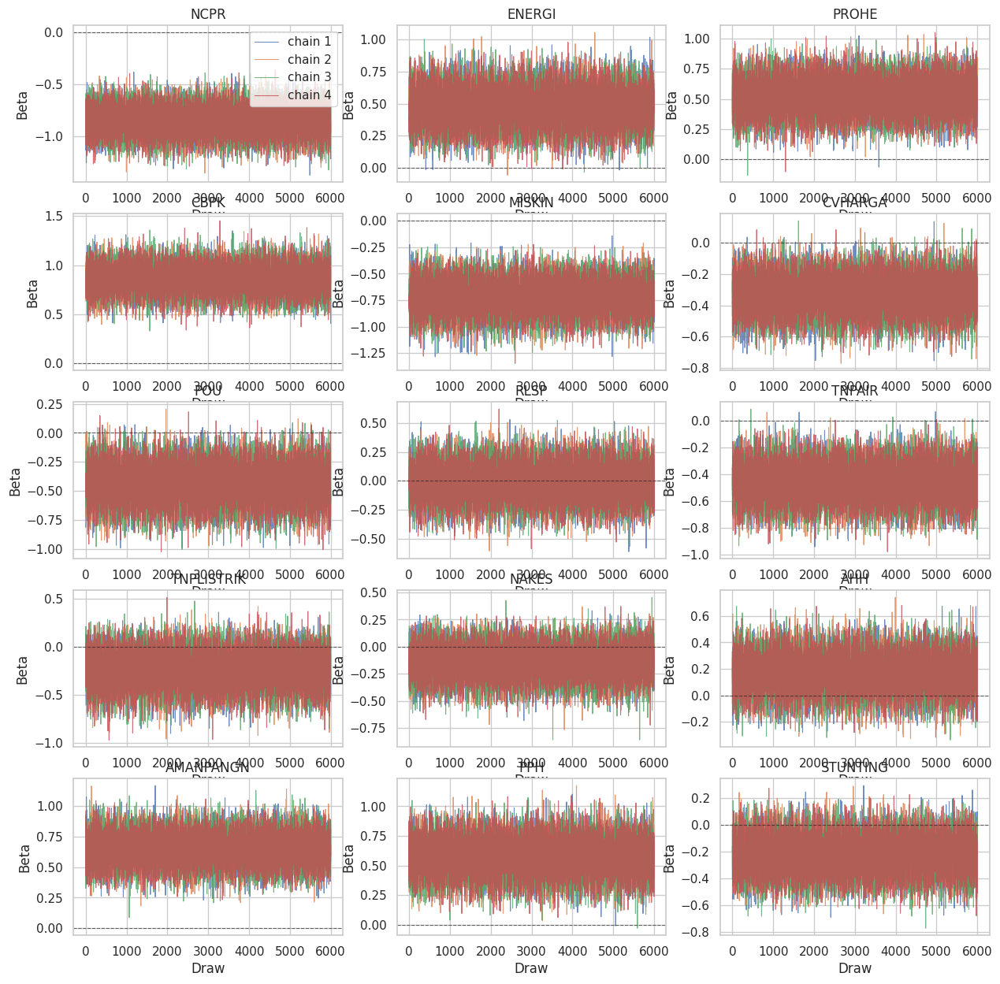

In [ ]:
beta_post = trace_car1.posterior["beta"].values  # (chains, draws, n_features)
n_chains, n_draws, n_features = beta_post.shape

n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))
axes = axes.flatten()

for i, nama_var in enumerate(KOLOM_PREDIKTOR):
    ax = axes[i]
    for c in range(n_chains):
        ax.plot(np.arange(n_draws), beta_post[c, :, i], lw=0.8, alpha=0.8, label=f'chain {c+1}' if i == 0 else None)
    ax.set_title(nama_var)
    ax.axhline(0, color='k', ls='--', lw=0.8, alpha=0.6)
    if i == 0:
        ax.legend()
    ax.set_xlabel('Draw')
    ax.set_ylabel('Beta')

for j in range(n_features, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig("trace_beta_per_variable.png", dpi=300)
plt.show()

IndexError: index 15 is out of bounds for axis 0 with size 15

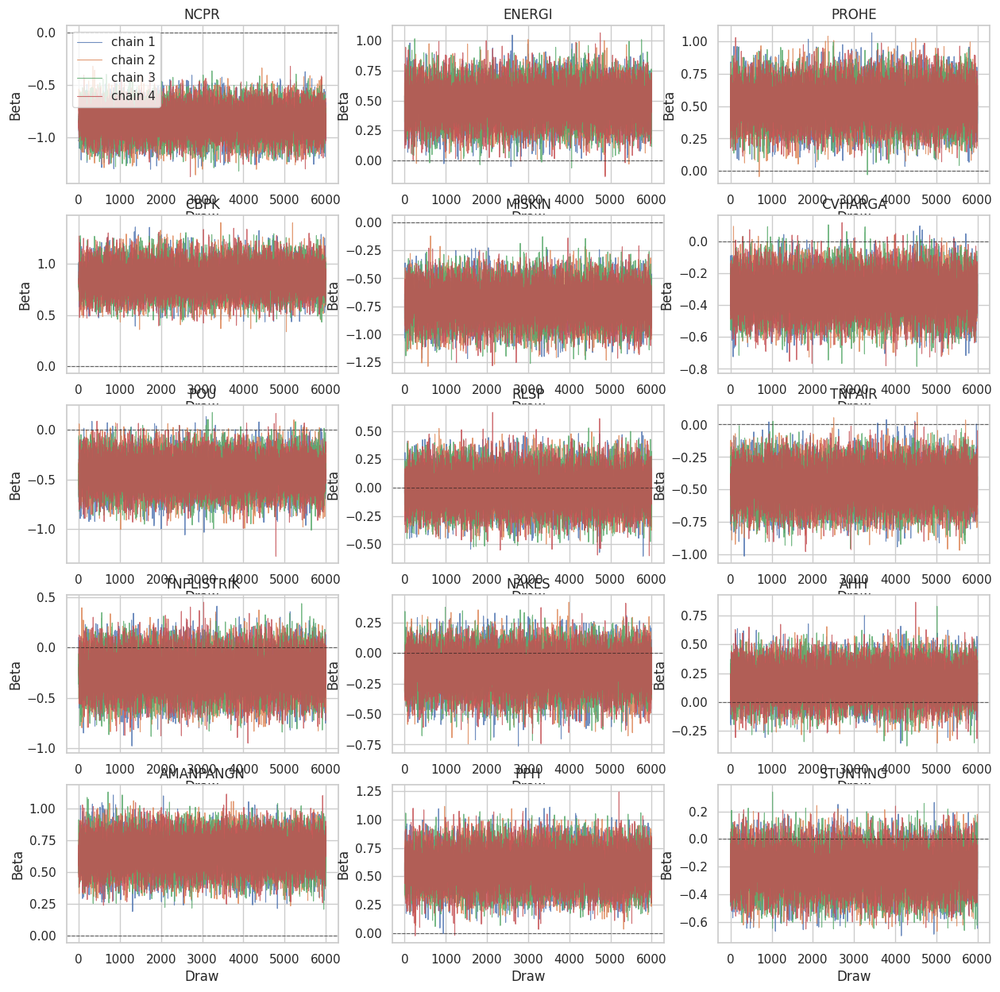

In [ ]:
# Trace plot untuk setiap koefisien beta (per variabel)
beta_post = trace_car1.posterior["beta"].values  # (chains, draws, n_features)
n_chains, n_draws, n_features = beta_post.shape

n_cols = 3
n_rows = int(np.ceil(n_features / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))
axes = axes.flatten()

for i, nama_var in enumerate(KOLOM_PREDIKTOR):
    ax = axes[i]
    for c in range(n_chains):
        ax.plot(np.arange(n_draws), beta_post[c, :, i], lw=0.8, alpha=0.8, label=f'chain {c+1}' if i == 0 else None)
    ax.set_title(nama_var)
    ax.axhline(0, color='k', ls='--', lw=0.8, alpha=0.6)
    if i == 0:
        ax.legend()
    ax.set_xlabel('Draw')
    ax.set_ylabel('Beta')

for j in range(n_features, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig("trace_beta_per_variable.png", dpi=300)
plt.show()

In [ ]:
# Posterior Predictive Check -- validasi akhir setelah fitting
with model_car:
    ppc = pm.sample_posterior_predictive(trace_car1, random_seed=42)

y_pred_mode = np.array([
    np.bincount(ppc.posterior_predictive["y_obs"].values[:, :, i].flatten(), minlength=n_cats).argmax()
    for i in range(n_obs)
])
akurasi_kasar = (y_pred_mode == y).mean()
print(f"Akurasi prediksi mode (perbandingan kasar, bukan metrik utama): {akurasi_kasar:.3f}")

prop_ppc = np.bincount(ppc.posterior_predictive["y_obs"].values.reshape(-1).astype(int), minlength=n_cats) / (
    ppc.posterior_predictive["y_obs"].size
)
prop_obs = np.bincount(y, minlength=n_cats) / len(y)
print(f"Proporsi kategori (posterior predictive): {np.round(prop_ppc, 3)}")
print(f"Proporsi kategori (observasi)            : {np.round(prop_obs, 3)}")


Output()

Akurasi prediksi mode (perbandingan kasar, bukan metrik utama): 0.955
Proporsi kategori (posterior predictive): [0.079 0.285 0.636]
Proporsi kategori (observasi)            : [0.076 0.292 0.632]


# 11. Perbandingan Model (LOO-CV)

In [ ]:
az.compare({"Multilevel": trace_car1, "Multilevel + CAR": trace_multilevel, "Pooled": trace_biasa}, ic="waic")

,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
Multilevel + CAR,0,-114.301354,5.435382,0.000000,1.000000e+00,5.900630,0.000000,False,log
Multilevel,1,-114.574677,6.189939,0.273324,7.216450e-16,5.904680,0.057657,False,log
Pooled,2,-117.279503,4.524732,2.978150,0.000000e+00,5.694378,0.573315,False,log


In [ ]:
"""
Perhitungan WAIC untuk Model Multilevel Spasial Bayesian (Ordered Logistic + CAR)
==================================================================================
Referensi: Vehtari, Gelman, & Gabry (2017); Watanabe (2010)

Script ini berisi dua cara menghitung WAIC:
  1. Cara praktis via ArviZ (az.waic) -- direkomendasikan untuk penggunaan sehari-hari
  2. Implementasi manual langkah-demi-langkah -- mengikuti rumus persis yang
     dibahas sebelumnya, sekaligus untuk diagnostik observasi berpengaruh
     (ambang kritis p_waic pointwise > 0.4 menurut Vehtari et al., 2017)

Prasyarat: idata (arviz.InferenceData) hasil sampling PyMC yang SUDAH memuat
log_likelihood. Jika belum ada, tambahkan terlebih dahulu:

    with model:
        idata = pm.sample(..., idata_kwargs={"log_likelihood": True})
    # atau, jika idata sudah ada:
    with model:
        pm.compute_log_likelihood(idata)
"""

# Ganti dengan InferenceData Anda yang sebenarnya
# trace_car = ...  # hasil sampling Model 1 (prior non-informatif)
# trace_car1 = ...  # hasil sampling Model 2 (prior weakly informative)


# ---------------------------------------------------------------------------
# 1. CARA PRAKTIS: menggunakan az.waic()
# ---------------------------------------------------------------------------
waic_model1 = az.waic(trace_biasa, pointwise=True)
waic_model2 = az.waic(trace_car1, pointwise=True)
waic_model3 = az.waic(trace_multilevel, pointwise=True)

print("=== Model 1 (Pooled) ===")
print(waic_model1)
print("\n=== Model 2 (Multilevel) ===")
print(waic_model2)
print("\n=== Model 3 (Multilevel + CAR) ===")
print(waic_model3)

# waic_model1 memuat, antara lain:
#   elpd_waic  -> nilai elpd (semakin BESAR semakin baik)
#   p_waic     -> penalti kompleksitas efektif (p_waic-topi)
#   waic_i     -> nilai WAIC pointwise per observasi
#   warning    -> True jika ada indikasi p_waic tidak andal

# WAIC pada skala deviance (-2 * elpd), jika ingin melaporkan dalam bentuk ini:
waic_deviance_model1 = -2 * waic_model1.elpd_waic
print(f"\nWAIC (skala deviance) Model 1: {waic_deviance_model1:.3f}")


# ---------------------------------------------------------------------------
# 2. PERBANDINGAN LANGSUNG KEDUA MODEL
# ---------------------------------------------------------------------------
comparison = az.compare(
    {
        "Model 1 (Pooled)": trace_biasa,
        "Model 2 (Multilevel)": trace_car1,
        "Model 3 (Multilevel + CAR)": trace_multilevel,
    },
    ic="waic",
)
print("\n=== Perbandingan Model (az.compare) ===")
print(comparison)


# ---------------------------------------------------------------------------
# 3. IMPLEMENTASI MANUAL (mengikuti rumus Vehtari et al., 2017)
# ---------------------------------------------------------------------------
def compute_waic_manual(idata, var_name=None):
    """
    Menghitung WAIC secara manual dari log_likelihood pada idata.

    Parameters
    ----------
    idata : arviz.InferenceData
        Harus memuat idata.log_likelihood dengan dimensi (chain, draw, obs_dim)
    var_name : str, optional
        Nama variabel observasi pada grup log_likelihood.
        Jika None, diambil variabel pertama yang tersedia.

    Returns
    -------
    dict berisi lpd_hat, p_waic, elpd_waic, waic, dan p_waic_pointwise
    (array per observasi, untuk diagnostik).
    """
    log_lik = idata.log_likelihood
    if var_name is None:
        var_name = list(log_lik.data_vars)[0]
    ll = log_lik[var_name]  # dims: (chain, draw, obs_dim)

    # Gabungkan chain & draw menjadi satu dimensi sampel S
    ll_matrix = ll.stack(sample=("chain", "draw")).values  # shape: (n_obs, S)
    n_obs, S = ll_matrix.shape

    # --- Langkah 1: lpd_hat, dihitung via log-sum-exp agar stabil numerik ---
    max_ll = np.max(ll_matrix, axis=1, keepdims=True)
    lpd_i = max_ll[:, 0] + np.log(np.mean(np.exp(ll_matrix - max_ll), axis=1))
    lpd_hat = np.sum(lpd_i)

    # --- Langkah 2: p_waic = varians posterior log-likelihood per observasi ---
    p_waic_i = np.var(ll_matrix, axis=1, ddof=1)  # ddof=1 -> pembagi (S-1)
    p_waic = np.sum(p_waic_i)

    # --- Langkah 3: gabungkan menjadi elpd_waic dan WAIC (skala deviance) ---
    elpd_waic = lpd_hat - p_waic
    waic = -2 * elpd_waic

    return {
        "lpd_hat": lpd_hat,
        "p_waic": p_waic,
        "elpd_waic": elpd_waic,
        "waic": waic,
        "p_waic_pointwise": p_waic_i,  # array (n_obs,) -- untuk diagnostik
    }


result_model1 = compute_waic_manual(trace_car)
print("\n=== Hasil Perhitungan Manual -- Model 1 ===")
print(f"lpd_hat    : {result_model1['lpd_hat']:.4f}")
print(f"p_waic     : {result_model1['p_waic']:.4f}")
print(f"elpd_waic  : {result_model1['elpd_waic']:.4f}")
print(f"WAIC       : {result_model1['waic']:.4f}")


# # ---------------------------------------------------------------------------
# # 4. DIAGNOSTIK OBSERVASI BERPENGARUH (ambang kritis Vehtari et al., 2017)
# # ---------------------------------------------------------------------------
# # Mengidentifikasi observasi dengan varians pointwise log-likelihood > 0.4,
# # yang menurut Vehtari et al. (2017) menyebabkan estimasi p_waic tidak andal.

# THRESHOLD = 0.4
# p_waic_pointwise = result_model1["p_waic_pointwise"]
# influential_idx = np.where(p_waic_pointwise > THRESHOLD)[0]

# print(f"\nJumlah observasi dengan p_waic pointwise > {THRESHOLD}: "
#       f"{len(influential_idx)} dari {len(p_waic_pointwise)} observasi")
# print(f"Indeks observasi berpengaruh: {influential_idx.tolist()}")
# print(f"Nilai p_waic pointwise pada observasi tersebut: "
#       f"{p_waic_pointwise[influential_idx].round(4).tolist()}")

# if len(influential_idx) > 0:
#     kontribusi_persen = (
#         p_waic_pointwise[influential_idx].sum() / p_waic_pointwise.sum() * 100
#     )
#     print(f"Kontribusi terhadap total p_waic: {kontribusi_persen:.1f}%")

=== Model 1 (Pooled) ===
Computed from 8000 posterior samples and 514 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -117.28     5.69
p_waic        4.52        -

=== Model 2 (Multilevel) ===
Computed from 24000 posterior samples and 514 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -114.57     5.90
p_waic        6.19        -

=== Model 3 (Multilevel + CAR) ===
Computed from 8000 posterior samples and 514 observations log-likelihood matrix.

          Estimate       SE
elpd_waic  -114.30     5.90
p_waic        5.44        -

WAIC (skala deviance) Model 1: 234.559

=== Perbandingan Model (az.compare) ===
                            rank   elpd_waic    p_waic  elpd_diff  \
Model 3 (Multilevel + CAR)     0 -114.301354  5.435382   0.000000   
Model 2 (Multilevel)           1 -114.574677  6.189939   0.273324   
Model 1 (Pooled)               2 -117.279503  4.524732   2.978150   

                                  weight        se  

In [ ]:
result_model_biasa = compute_waic_manual(trace_biasa)
result_model_car = compute_waic_manual(trace_car1)
result_model_multilevel = compute_waic_manual(trace_multilevel)
print("\n=== Hasil Perhitungan Manual -- Model Pooled ===")
print(f"lpd_hat    : {result_model_biasa['lpd_hat']:.4f}")
print(f"p_waic     : {result_model_biasa['p_waic']:.4f}")
print(f"elpd_waic  : {result_model_biasa['elpd_waic']:.4f}")
print(f"WAIC       : {result_model_biasa['waic']:.4f}")
print("\n=== Hasil Perhitungan Manual -- Model Multilevel ===")
print(f"lpd_hat    : {result_model_car['lpd_hat']:.4f}")
print(f"p_waic     : {result_model_car['p_waic']:.4f}")
print(f"elpd_waic  : {result_model_car['elpd_waic']:.4f}")
print(f"WAIC       : {result_model_car['waic']:.4f}")
print("\n=== Hasil Perhitungan Manual -- Model Multilevel + CAR ===")
print(f"lpd_hat    : {result_model_multilevel['lpd_hat']:.4f}")
print(f"p_waic     : {result_model_multilevel['p_waic']:.4f}")
print(f"elpd_waic  : {result_model_multilevel['elpd_waic']:.4f}")
print(f"WAIC       : {result_model_multilevel['waic']:.4f}")


=== Hasil Perhitungan Manual -- Model Pooled ===
lpd_hat    : -112.7548
p_waic     : 4.5253
elpd_waic  : -117.2801
WAIC       : 234.5601

=== Hasil Perhitungan Manual -- Model Multilevel ===
lpd_hat    : -108.3847
p_waic     : 6.1902
elpd_waic  : -114.5749
WAIC       : 229.1499

=== Hasil Perhitungan Manual -- Model Multilevel + CAR ===
lpd_hat    : -108.8660
p_waic     : 5.4361
elpd_waic  : -114.3020
WAIC       : 228.6041


/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:1057: RuntimeWarning: overflow encountered in exp
  weights = 1 / np.exp(len_scale - len_scale[:, None]).sum(axis=1)
/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
CAR,0,-24.012968,11.968114,0.000000,1.000000e+00,3.962241,0.00000,True,log
CAR1,1,-114.643154,6.211168,90.630186,1.647606e-10,5.908109,5.23732,False,log


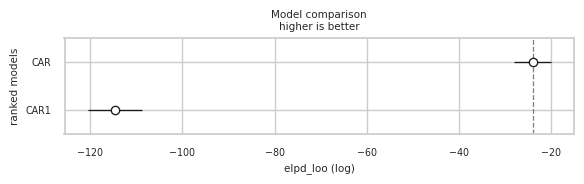

In [ ]:
model_comp = az.compare(
    {"CAR1": trace_car1, "CAR": trace_car}, ic="loo"
)
display(model_comp)

az.plot_compare(model_comp)
# plt.title('Perbandingan Model — LOO-CV')
plt.tight_layout()
plt.savefig('perbandingan_model_loo.png', dpi=300)
plt.show()

/usr/local/lib/python3.12/dist-packages/arviz/stats/stats.py:1667: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
CAR,0,-21.322811,9.277957,0.00000,1.0,3.407521,0.000000,True,log
CAR1,1,-114.610300,6.178314,93.28749,0.0,5.905861,5.082324,False,log


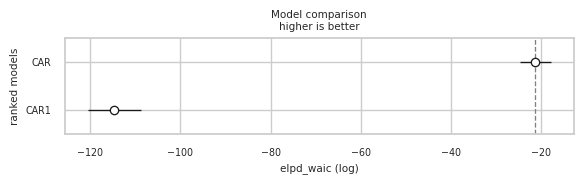

In [ ]:
# Perbandingan Model menggunakan DIC (Deviance Information Criterion)
model_comp_dic = az.compare(
    {"CAR1": trace_car1, "CAR": trace_car}, ic="waic"
)
display(model_comp_dic)

az.plot_compare(model_comp_dic)
# plt.title('Perbandingan Model — WAIC')
plt.tight_layout()
plt.savefig('perbandingan_model_waic.png', dpi=300)
plt.show()

In [ ]:
# Simpan tabel hasil perbandingan model (LOO & WAIC) jika sudah tersedia
for label, varname, fname in [
    ("LOO", "model_comp", "model_comparison_loo"),
    ("WAIC", "model_comp_dic", "model_comparison_waic"),
]:
    df = globals().get(varname)
    if df is None:
        print(f"{label} hasil tidak ditemukan ({varname}), dilewatkan.")
        continue
    df.to_excel(f"{fname}.xlsx", index=True)
    df.to_csv(f"{fname}.csv", index=True)
    print(f"Tersimpan: {fname}.xlsx, {fname}.csv")

Tersimpan: model_comparison_loo.xlsx, model_comparison_loo.csv
Tersimpan: model_comparison_waic.xlsx, model_comparison_waic.csv


# 12. Interpretasi Koefisien Model Final (CAR)

In [ ]:
def buat_tabel_odds_ratio(trace1, x_cols, hdi_prob=0.95):
    """Rangkuman koefisien beta & gamma beserta odds ratio (exp(beta)) dan HDI."""
    ringkasan_beta = az.summary(trace1, var_names=["beta"], hdi_prob=hdi_prob)
    ringkasan_beta["Variabel"] = x_cols

    ringkasan_gamma = az.summary(trace1, var_names=["gamma"], hdi_prob=hdi_prob)
    ringkasan_gamma["Variabel"] = ["BANSOS"]

    gabungan = pd.concat([ringkasan_beta, ringkasan_gamma])
    gabungan["OR"] = np.exp(gabungan["mean"])

    kolom_hdi = [c for c in gabungan.columns if c.startswith("hdi_")]
    return gabungan[["Variabel", "mean", "OR"] + kolom_hdi].rename(columns={"mean": "Koefisien (B)"})


tabel_or = buat_tabel_odds_ratio(trace_car1, X_cols)
display(tabel_or.round(3))
tabel_or.round(3).to_excel('hasil_odds_ratio.xlsx', index=False)


,Variabel,Koefisien (B),OR,hdi_2.5%,hdi_97.5%
beta[NCPR],NCPR,-0.849,0.428,-1.112,-0.580
beta[ENERGI],ENERGI,0.476,1.610,0.190,0.756
beta[PROHE],PROHE,0.518,1.679,0.243,0.798
beta[CBPK],CBPK,0.856,2.354,0.594,1.131
beta[MISKIN],MISKIN,-0.720,0.487,-1.019,-0.425
beta[CVHARGA],CVHARGA,-0.332,0.717,-0.558,-0.105
beta[POU],POU,-0.440,0.644,-0.748,-0.118
beta[RLSP],RLSP,-0.010,0.990,-0.302,0.290
beta[TNPAIR],TNPAIR,-0.461,0.631,-0.723,-0.193
beta[TNPLISTRIK],TNPLISTRIK,-0.245,0.783,-0.606,0.108


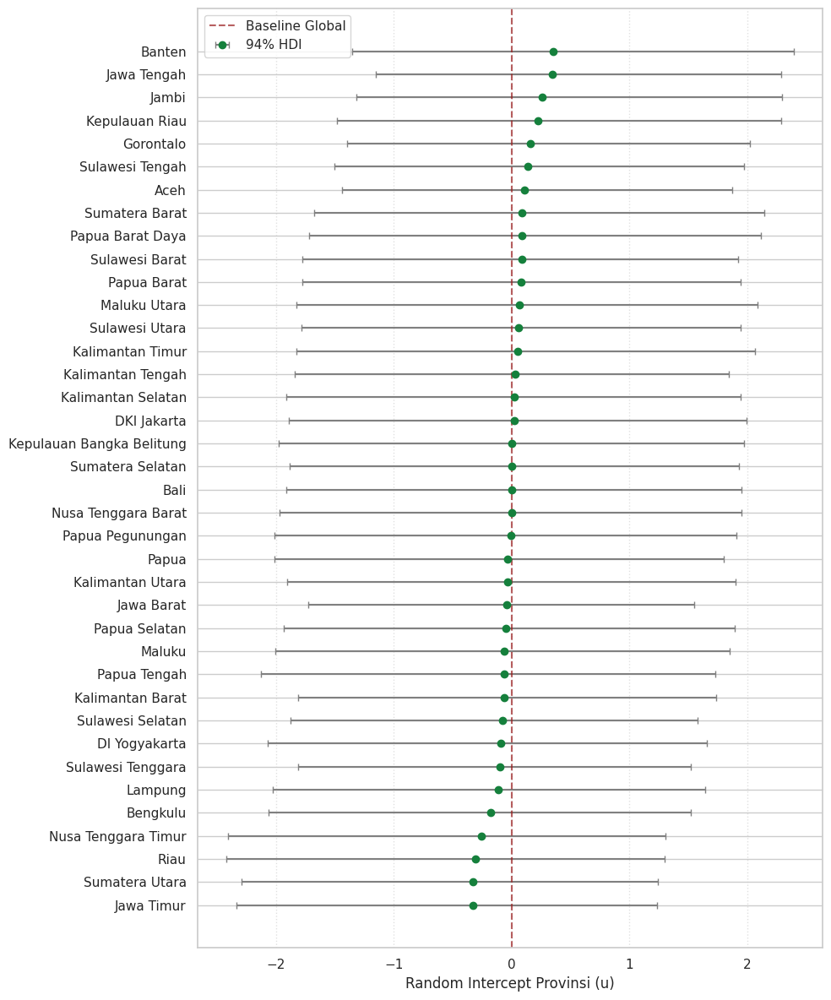

Provinsi dengan efek acak signifikan: 0 dari 38


,provinsi,mean,hdi_lower,hdi_upper,signifikan


In [ ]:
# Caterpillar plot: efek acak provinsi (u) -- mengidentifikasi provinsi dengan penyimpangan signifikan dari rata-rata
ringkasan_u = az.summary(trace_car1, var_names=["u"], hdi_prob=0.94)
df_u = pd.DataFrame({
    'provinsi': provinces,
    'mean': ringkasan_u['mean'].values,
    'hdi_lower': ringkasan_u['hdi_3%'].values,
    'hdi_upper': ringkasan_u['hdi_97%'].values,
}).sort_values('mean').reset_index(drop=True)

plt.figure(figsize=(10, 12))
plt.errorbar(
    x=df_u['mean'], y=df_u.index,
    xerr=[df_u['mean'] - df_u['hdi_lower'], df_u['hdi_upper'] - df_u['mean']],
    fmt='o', color='#15803c', ecolor='gray', capsize=3, label='94% HDI',
)
plt.axvline(x=0, color='#991b1c', linestyle='--', alpha=0.7, label='Baseline Global')
plt.yticks(df_u.index, df_u['provinsi'])
plt.xlabel('Random Intercept Provinsi (u)')
plt.grid(axis='x', linestyle=':', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.savefig('caterpillar_u.png', dpi=300)
plt.show()

# Tandai provinsi yang penyimpangannya signifikan (HDI tidak mencakup 0)
df_u["signifikan"] = (df_u["hdi_lower"] > 0) | (df_u["hdi_upper"] < 0)
print(f"Provinsi dengan efek acak signifikan: {df_u['signifikan'].sum()} dari {len(df_u)}")
display(df_u[df_u["signifikan"]])


In [ ]:
# Kontribusi relatif varians provinsi (u) vs varians spasial kabupaten (phi)
ringkasan_variance = az.summary(trace_car1, var_names=["variance_u", "variance_phi"], hdi_prob=0.94)
display(ringkasan_variance.round(4))
print(
    "Semakin besar 'variance_phi' relatif terhadap 'variance_u', semakin besar peran struktur "
    "spasial kabupaten/kota (bukan sekadar pengelompokan administratif provinsi) dalam menjelaskan "
    "variasi status ketahanan pangan."
)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
variance_u,0.038,0.055,0.0,0.137,0.000,0.001,11006.0,10167.0,1.0
variance_phi,0.055,0.082,0.0,0.198,0.001,0.001,8707.0,9022.0,1.0


Semakin besar 'variance_phi' relatif terhadap 'variance_u', semakin besar peran struktur spasial kabupaten/kota (bukan sekadar pengelompokan administratif provinsi) dalam menjelaskan variasi status ketahanan pangan.


# 13. Ekspor Hasil Akhir

In [ ]:
az.summary(trace_car1).to_excel('summary_model_car.xlsx')

diagnostik_final = az.summary(
    trace_car1, var_names=["beta", "gamma", "sigma_u", "a_spatial", "sigma_phi", "cutpoints"], hdi_prob=0.94
).loc[:, ['ess_bulk', 'ess_tail', 'r_hat']]
diagnostik_final.to_excel('ess_diagnostik.xlsx')

final_data_export = final_data.drop(columns=['centroid'], errors='ignore')
final_data_export.to_file("dataset_final.gpkg", driver='GPKG')

print("Semua hasil (Excel & GeoPackage) berhasil diekspor.")


Semua hasil (Excel & GeoPackage) berhasil diekspor.


In [ ]:
import json
# 1. Hitung nilai rata-rata (mean) posterior dari trace_car1
beta_means = trace_car1.posterior["beta"].mean(dim=["chain", "draw"]).values
gamma_mean = float(trace_car1.posterior["gamma"].mean(dim=["chain", "draw"]))
u_means = trace_car1.posterior["u"].mean(dim=["chain", "draw"]).values
phi_means = trace_car1.posterior["phi"].mean(dim=["chain", "draw"]).values
cutpoints_means = trace_car1.posterior["cutpoints"].mean(dim=["chain", "draw"]).values

# 2. Definisikan urutan fitur Level 1 (X) sesuai dengan matriks X saat training
# PASTIKAN urutannya sama persis dengan urutan kolom pada data X Anda
features_x = [
    "ncpr", "kemiskinan", "pengeluaran_pangan", "tanpa_listrik", 
    "tanpa_air_bersih", "lama_sekolah_perempuan", "tenaga_kesehatan", 
    "harapan_hidup", "stunting"
]
beta_dict = {feat: float(b) for feat, b in zip(KOLOM_PREDIKTOR, beta_means)}

# 3. Ekstrak Efek Acak Provinsi (u)
# Ambil urutan nama provinsi sesuai dengan koordinat/index yang digunakan saat training
# Biasanya diperoleh dari sorted(final_data['Provinsi'].unique()) atau kategori codes-nya
list_provinsi = sorted(final_data['Provinsi'].unique()) 
u_provinsi_dict = {str(prov): float(u) for prov, u in zip(list_provinsi, u_means)}

# 4. TERBARU: Ekstrak Efek Acak Spasial Kabupaten/Kota (phi)
# Ambil urutan nama kabupaten/kota sesuai dengan urutan index yang dimasukkan ke model (W_sym)
list_kabupaten = sorted(final_data['Kabupaten/Kota'].unique()) # Sesuaikan dengan mapping kab_idx Anda
phi_kabupaten_dict = {str(kab): float(p) for kab, p in zip(list_kabupaten, phi_means)}

# 5. Gabungkan semua nilai ke dalam satu struktur dictionary
model_weights_updated = {
    "beta": beta_dict,
    "gamma": gamma_mean,
    "u_provinsi": u_provinsi_dict,
    "phi_kabupaten": phi_kabupaten_dict, # Komponen CAR Model baru
    "cutpoints": cutpoints_means.tolist()
}

# 6. Simpan menjadi file model_weights.json
with open("model_weights.json", "w") as f:
    json.dump(model_weights_updated, f, indent=4)

# from google.colab import files
# files.download("model_weights.json")

print("✨ Berhasil! File 'model_weights.json' untuk model CAR telah diperbarui.")
print("Silahkan upload/timpa file json ini ke repository Git atau folder dashboard Anda.")

✨ Berhasil! File 'model_weights.json' untuk model CAR telah diperbarui.
Silahkan upload/timpa file json ini ke repository Git atau folder dashboard Anda.


In [ ]:
with model_car1:
    ppc = pm.sample_posterior_predictive(trace_car1, var_names=["y_obs"])

Output()

In [ ]:
# Hitung peluang posterior per kategori untuk setiap observasi
posterior_probs = ppc.posterior_predictive["y_obs"].mean(dim=["chain", "draw"])
prob_per_obs = np.zeros((n_obs, n_cats))

for i in range(n_obs):
    counts = np.bincount(ppc.posterior_predictive["y_obs"].values[:, :, i].flatten().astype(int), minlength=n_cats)
    prob_per_obs[i] = counts / counts.sum()

# Buat tabel: Kabupaten/Kota + 15 variabel prediktor + 3 kolom peluang kategori
tabel_hasil = final_data[["Kabupaten/Kota", "Provinsi"] + KOLOM_PREDIKTOR].copy()
tabel_hasil["Prob_Rentan"] = prob_per_obs[:, 0]
tabel_hasil["Prob_Tahan"] = prob_per_obs[:, 1]
tabel_hasil["Prob_Sangat_Tahan"] = prob_per_obs[:, 2]
tabel_hasil["Prediksi_Kategori"] = tabel_hasil[["Prob_Rentan", "Prob_Tahan", "Prob_Sangat_Tahan"]].idxmax(axis=1).map({
    "Prob_Rentan": "Rentan", "Prob_Tahan": "Tahan", "Prob_Sangat_Tahan": "Sangat Tahan"
})

# Simpan ke Excel dan CSV
tabel_hasil.to_excel("hasil_prediksi_probabilitas.xlsx", index=False)
tabel_hasil.to_csv("hasil_prediksi_probabilitas.csv", index=False)

display(tabel_hasil.head(10))
print(f"Tabel tersimpan: hasil_prediksi_probabilitas.xlsx dan hasil_prediksi_probabilitas.csv")

,Kabupaten/Kota,Provinsi,NCPR,ENERGI,PROHE,CBPK,MISKIN,CVHARGA,POU,RLSP,...,NAKES,AHH,AMANPANGN,PPH,STUNTING,BANSOS,Prob_Rentan,Prob_Tahan,Prob_Sangat_Tahan,Prediksi_Kategori
0,Aceh Selatan,Aceh,0.91,94.4,73.7,100.0,12.1,7.4,13.7,8.50,...,2.22,64.81,65.2,69.8,40.2,1.159688e+12,0.001875,0.395792,0.602333,Sangat Tahan
1,Aceh Tenggara,Aceh,0.55,103.1,92.2,0.0,12.5,8.9,13.0,10.13,...,2.20,68.65,40.0,82.7,32.9,1.159688e+12,0.006000,0.681333,0.312667,Tahan
2,Aceh Timur,Aceh,0.77,95.3,92.1,0.0,13.4,7.3,8.6,8.99,...,1.68,69.07,87.2,79.2,29.7,1.159688e+12,0.002000,0.434292,0.563708,Sangat Tahan
3,Aceh Tengah,Aceh,2.87,98.2,81.6,0.0,14.4,5.7,8.6,10.04,...,2.16,69.18,70.5,84.1,23.6,1.159688e+12,0.001875,0.438708,0.559417,Sangat Tahan
4,Aceh Barat,Aceh,0.71,97.7,101.5,12.0,17.9,9.5,6.2,10.27,...,1.46,68.34,71.3,83.4,33.4,1.159688e+12,0.002000,0.429333,0.568667,Sangat Tahan
5,Aceh Besar,Aceh,0.50,90.1,83.7,25.8,13.4,5.5,8.6,10.87,...,1.38,70.14,76.7,75.1,30.1,1.159688e+12,0.000958,0.280042,0.719000,Sangat Tahan
6,Pidie,Aceh,0.38,98.6,72.1,0.0,18.8,4.8,9.1,9.29,...,0.70,67.29,16.3,71.7,29.5,1.159688e+12,0.021000,0.867083,0.111917,Tahan
7,Aceh Utara,Aceh,0.50,91.8,89.9,0.0,16.6,6.9,14.2,9.37,...,0.56,69.15,62.0,80.8,25.2,1.159688e+12,0.005542,0.671375,0.323083,Tahan
8,Simeulue,Aceh,0.82,96.2,82.8,0.0,17.9,16.5,10.9,9.91,...,1.68,65.61,35.3,69.6,30.7,1.159688e+12,0.124208,0.849667,0.026125,Tahan
9,Aceh Singkil,Aceh,9.07,104.2,94.2,0.0,19.2,6.6,7.3,9.02,...,1.74,67.78,31.5,91.1,34.1,1.159688e+12,0.025625,0.867375,0.107000,Tahan


Tabel tersimpan: hasil_prediksi_probabilitas.xlsx dan hasil_prediksi_probabilitas.csv


In [ ]:
# Simpan matriks bobot spasial (W_sym) menjadi CSV dengan label kabupaten/kota
try:
    labels = list(kabupaten)
except NameError:
    labels = list(final_data['Kabupaten/Kota'].unique())

if 'W_sym' not in globals():
    W_sym, _ = w_car.full()
    np.fill_diagonal(W_sym, 0)

W_df = pd.DataFrame(W_sym, index=labels, columns=labels)
W_df.to_csv("W_sym_matrix.csv", index=True)
print("W_sym_matrix.csv tersimpan.")

AttributeError: 'numpy.ndarray' object has no attribute 'transform'

In [ ]:
dataset_all_vars = final_data.copy()

# Pastikan kolom Kabupaten/Kota dan Provinsi tetap ada di depan jika ingin mudah dilihat
kolom_urutan = ["Kabupaten/Kota", "Provinsi", "KATEGORI"] + [
    col for col in KOLOM_NUMERIK_LENGKAP
    if col not in {"Kabupaten/Kota", "Provinsi", "KATEGORI"}
]
dataset_all_vars = dataset_all_vars[kolom_urutan]

# Simpan versi CSV tanpa geometry, dan versi GeoPackage lengkap dengan geometry
# dataset_all_vars.drop(columns=["centroid"], errors="ignore").to_csv(
#     "dataset_all_vars.csv", index=False
# )
# dataset_all_vars.to_file("dataset_all_vars.gpkg", driver="GPKG")
dataset_all_vars.to_csv("data_ringan.csv", index=False)
print("Dataset lengkap disimpan sebagai dataset_all_vars.csv dan dataset_all_vars.gpkg")

Dataset lengkap disimpan sebagai dataset_all_vars.csv dan dataset_all_vars.gpkg


# 14. Prediksi

In [ ]:
final_data["PREDIKSI_KATEGORI"] = pd.Categorical.from_codes(
    y_pred_mode.astype(int),
    categories=KATEGORI_ORDER,
    ordered=True,
)

fig, ax = plt.subplots(figsize=(14, 8))
warna_prediksi = ['#15803c', '#fde78c', '#991b1c']  # Hijau, Kuning, Merah
final_data.plot(
    column="PREDIKSI_KATEGORI",
    ax=ax,
    cmap=CMAP_HIJAU_KE_MERAH,
    linewidth=0.25,
    edgecolor="black",
    categorical=True,
    legend=True,
    legend_kwds={"title": "Prediksi Ketahanan Pangan", "loc": "lower left"},
)
# ax.set_title("Peta Prediksi Kategori IKP berdasarkan Model CAR")
ax.set_axis_off()
plt.tight_layout()
plt.savefig("peta_prediksi_kategori_ikp.png", dpi=300)
plt.show()

NameError: name 'y_pred_mode' is not defined